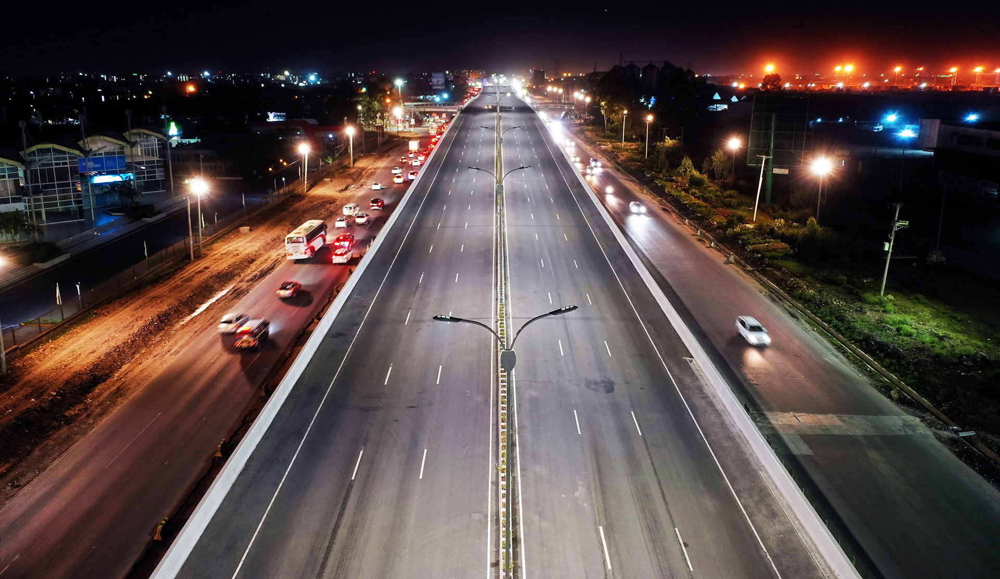

<h1 style="background-color: lightblue; font-family: 'Arial Black', sans-serif; color: black; font-size: 200%; text-align: center; padding: 20px; border-radius: 20px;">Enhancing Road Infrastructure Management through Computer Vision: Deep Learning for Road Condition Classification</h1>

<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Executive Summary:</font></h3>

The Road Inventory and Condition Survey (RICS), conducted by the Kenya Roads Board, is a critical but labor-intensive process used to evaluate the state of road infrastructure in Kenya. Recognizing the challenges associated with the manual aspects of RICS, our project proposes a revolutionary and innovative shift towards an automated, efficient, and objective method for road condition assessment using advanced computer vision and deep learning methodologies. This project developed a robust classification system capable of categorizing roads into five distinct conditions: 'good', 'fair', 'poor', 'flooded', and 'unpaved'. Leveraging models such as DenseNet, VGG16, and EfficientNet, we conducted extensive experiments to identify the model that best suits the diverse and complex nature of road conditions. The findings and methodologies outlined in this project not only enhance the efficiency of road assessments but also aim to significantly reduce costs and improve strategic decision-making processes within the road maintenance and management sectors in Kenya and beyond.

<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Problem Statement:</font></h3>

The Road Inventory and Condition Survey (RICS) conducted every three years by the Kenya Roads Board, is a vital but labor-intensive method for assessing road conditions in Kenya. Its manual nature, often relying on visual assessments, result in delays and inaccuracies in categorizing road conditions, hindering effective maintenance planning and resource allocation. This poses challenges for road maintenance authorities, government agencies such as KeNHA, KURA, KeRRA, County Governments, and the Ministry of Transport & Infrastructure and Civil Engineers involved in road infrastructure management.

Recognizing the inefficiencies inherent in manual assessments like RICS, there arises an urgent need for a more objective and efficient approach. To address this challenge, the development of a computer vision and deep learning solution becomes paramount. This solution aims to automate the manual process of road condition classification assessments based on images, segmenting roads into five distinct classes: 'good', 'fair', 'poor', 'flooded', and 'unpaved'. By streamlining the assessment process, it promises more timely and targeted maintenance interventions.

As the demands on transportation systems escalate and road infrastructure continues to evolve in Kenya, the need for faster, more objective, and accessible road condition assessment tools becomes increasingly evident. By leveraging the capabilities of deep learning, we aspire to revolutionize road infrastructure management, ultimately contributing to improved road safety, reduced maintenance costs, and enhanced transportation efficiency, benefitting both road users and society at large.

<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Research Questions:</font></h3>

1. Which deep learning model architecture demonstrates the highest efficacy in accurately classifying road conditions from image data, considering metrics such as accuracy, precision, and recall across different road conditions?
2. How do various data augmentation techniques impact the performance and generalizability of the deep learning model for road condition classification on unseen data?
3. Can transfer learning from pre-trained models such as DenseNET, VGG16 or EfficientNet, enhance the performance of road condition classification models?
4. What are the potential socio-economic impacts of implementing the automated road condition classification system, and how can these insights inform policy decisions and resource allocation strategies in the transportation infrastructure domain?


<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Outline Approach:</font></h3>



<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Data Understanding:</font></h3>
    

In this section, we conduct a comprehensive analysis of the dataset used for the road condition classification project. The dataset has been carefully compiled using a systematic methodology, incorporating a wide range of local and global sources to ensure diversity and representativeness.
    
**Data Collection Process:**

The dataset is compiled by scraping images of roads from various regions worldwide, initially focusing on Kenya.
A custom Python script was developed to gather these images depicting roads in distinct conditions, and a manual categorization of the images into predefined classes ensued afterwards.
The collection process was then expanded to encompass roads across Asia and subsequently extended to cover diverse regions worldwide.
    
**Road Condition Classes:**

The dataset encompasses a spectrum of road conditions, classified into five distinct categories:
1. **Good:** Roads with minimal surface imperfections, exhibiting optimal condition.
2. **Fair:** Roads showcasing minor cracking or superficial wear.
3. **Poor:** Roads characterized by significant surface deterioration, including deep potholes or cracks.
4. **Flooded:** Roads inundated with water, either due to natural calamities or poor drainage systems.
5. **Unpaved:** Roads composed of earth or gravel, lacking paved surfaces.

**Data Diversity and Representativeness:**

Emphasis is placed on ensuring the dataset's diversity, encompassing roads from various geographical, climatic, and socioeconomic backgrounds.
The dataset encompasses images captured under different lighting conditions, weather scenarios, and road infrastructural variations, ensuring robustness and generalizability of the classification model.
    
**Professional Standards:**

The data collection process adheres to professional standards, meticulously curating and annotating images to maintain quality and accuracy.
Each image is rigorously reviewed and categorized by a domain expert to ensure consistency and reliability of the dataset.
    
By employing a systematic approach to data collection and curation, the dataset aims to provide a comprehensive representation of road conditions worldwide. This meticulous approach ensures the efficacy and reliability of the subsequent classification model, facilitating informed decision-making in road infrastructure management and maintenance planning on a global scale.

<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 1 | Import Libraries</strong></p>


In [1]:
 # Data manipulation libraries
import pandas as pd
import numpy as np
 # System libraries
import os
import cv2
import re
import shutil
 # Image processing libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
%matplotlib inline
import seaborn as sns
from sklearn.metrics import confusion_matrix
from PIL import Image
 # Deep learning libraries
import tensorflow as tf
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
 # Suppress warnings
import warnings
warnings.filterwarnings("ignore")
import datetime

<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 2 | Exploratory Data Analysis (EDA)</strong></p>

In this section, we will seek to understand our dataset as this will inform our next steps in data pre processing as well as  the approach to take when data modelling.  


- Our dataset is organised in 3 folders, **train, validation and test.**  
- Each of these folders has 5 subfolders, **fair, flooded, good, unpaved and poor**  that store images of roads in the respective conditions.

In [5]:
# Accessing the dataset
input_path = "/kaggle/input/roads-kenya-dataset"

# Define variables for our folders and subfolders
sets = ['train', 'validation', 'test']
categories = ['fair', 'flooded', 'good', 'unpaved', 'poor']

- We will sample a few roads from each of the categories to have a view of how the roads look like in each category. This will allows us to visually inspect the dataset's variability, characteristics and get a sense of the dataset's content.  

- Additionally, we will determine the number of images in each category to better understand the dataset's composition and balance.

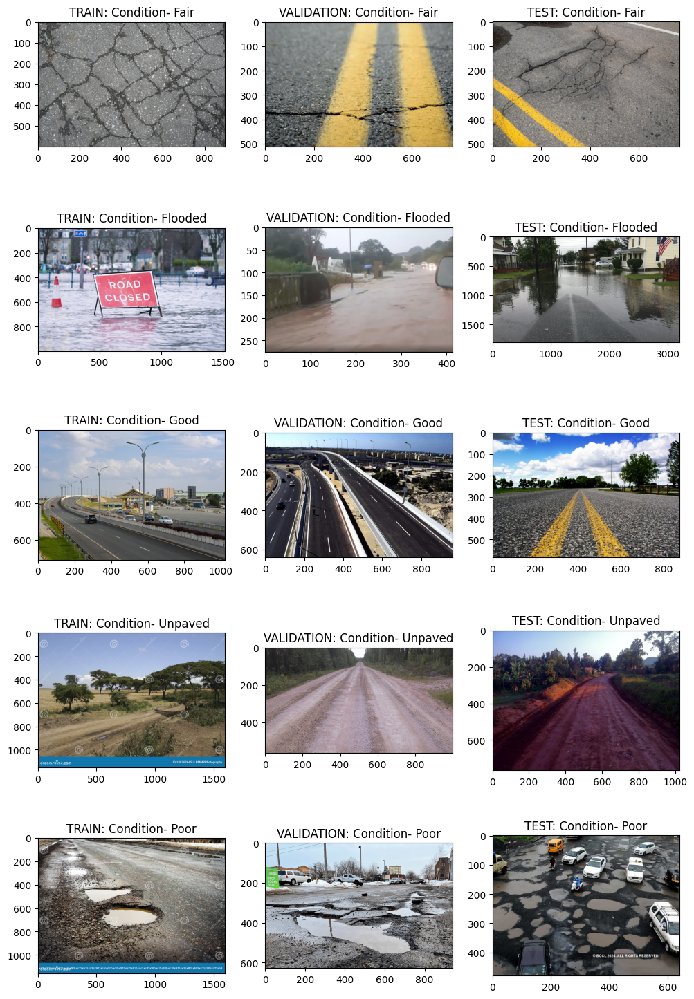

TRAIN: Fair images: 229, Flooded images: 253, Good images: 634, Unpaved images: 357, Poor images: 303
VALIDATION: Fair images: 49, Flooded images: 54, Good images: 136, Unpaved images: 77, Poor images: 65
TEST: Fair images: 50, Flooded images: 55, Good images: 136, Unpaved images: 77, Poor images: 66


In [31]:
# Create subplots for visualization
fig, ax = plt.subplots(5, 3, figsize=(10, 15))
plt.tight_layout()

# Loop through each set (train, validation, test)
for col, _set in enumerate(sets):
    set_path = os.path.join(input_path, _set)
    
    # Initialize row index
    row = 0
    
    # Visualize images from the 'fair' folder
    fair_path = os.path.join(set_path, 'fair')
    fair_images = [image for image in os.listdir(fair_path) if not image.startswith('.')]
    if fair_images:
        img = mpimg.imread(os.path.join(fair_path, fair_images[1]))
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].set_title(f'{_set.upper()}: Condition- Fair')
        row += 1
    
    # Visualize images from the 'flooded' folder
    flooded_path = os.path.join(set_path, 'flooded')
    flooded_images = [image for image in os.listdir(flooded_path) if not image.startswith('.')]
    if flooded_images:
        img = mpimg.imread(os.path.join(flooded_path, flooded_images[0]))
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].set_title(f'{_set.upper()}: Condition- Flooded')
        row += 1
    
    # Visualize images from the 'good' folder
    good_path = os.path.join(set_path, 'good')
    good_images = [image for image in os.listdir(good_path) if not image.startswith('.')]
    if good_images:
        img = mpimg.imread(os.path.join(good_path, good_images[0]))
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].set_title(f'{_set.upper()}: Condition- Good')
        row += 1
    
    # Visualize images from the 'unpaved' folder
    unpaved_path = os.path.join(set_path, 'unpaved')
    unpaved_images = [image for image in os.listdir(unpaved_path) if not image.startswith('.')]
    if unpaved_images:
        img = mpimg.imread(os.path.join(unpaved_path, unpaved_images[0]))
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].set_title(f'{_set.upper()}: Condition- Unpaved')
        row += 1
    
    # Visualize images from the 'poor' folder
    poor_path = os.path.join(set_path, 'poor')
    poor_images = [image for image in os.listdir(poor_path) if not image.startswith('.')]
    if poor_images:
        img = mpimg.imread(os.path.join(poor_path, poor_images[3]))
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].set_title(f'{_set.upper()}: Condition- Poor')
        row += 1

plt.show()

# Loop through the directories to count images
for _set in sets:
    n_fair = len(os.listdir(os.path.join(input_path, _set, 'fair')))
    n_flooded = len(os.listdir(os.path.join(input_path, _set, 'flooded')))
    n_good = len(os.listdir(os.path.join(input_path, _set, 'good')))
    n_unpaved = len(os.listdir(os.path.join(input_path, _set, 'unpaved')))
    n_poor = len(os.listdir(os.path.join(input_path, _set, 'poor')))
    print(f"{_set.upper()}: Fair images: {n_fair}, Flooded images: {n_flooded}, Good images: {n_good}, Unpaved images: {n_unpaved}, Poor images: {n_poor}")


- We then examine the image sizes of our dataset by investigating the minimum image size and the maximum image size in each of our categories. Understanding the range of image sizes facilitates informed choices regarding resizing, cropping, or padding strategies, ensuring compatibility with our model architecture. 

- For this task we will utilize **python's opencv** library due do its superior featues in computer vision tasks, such as object detection, image segmentation, and feature extraction as well as its GPU acceleration support.

In [32]:
# Loop through each set (train, validation, test)
for _set in sets:
    if _set != 'train':
        print()  
    print(f"{_set.upper()}: ", end="")
    
    # Loop through each category (fair, flooded, good, unpaved, poor)
    for category in categories:
        images_path = os.path.join(input_path, _set, category)
        
        # Initialize variables to store image sizes and failed read count
        image_sizes = []
        failed_read_count = 0
        
        # Loop through each image file in the current category
        for image_file in os.listdir(images_path):
            if not image_file.startswith('.'):
                image_path = os.path.join(images_path, image_file)
                try:
                    img = cv2.imread(image_path)
                    if img is None:
                        failed_read_count += 1
                    else:
                        height, width, _ = img.shape
                        image_sizes.append((width, height))
                except Exception as e:
                    print(f"Error reading image '{image_path}': {e}")
                    continue
        
        # If there are image sizes in the list, calculate and print min and max dimensions
        if image_sizes:
            min_width, min_height = min(image_sizes)
            max_width, max_height = max(image_sizes)
            print(f"{category} images: Min ({min_width}x{min_height}), Max ({max_width}x{max_height})", end="")
        
         # If there are images that failed to read, print the count of failed reads
        if failed_read_count > 0:
            print(f", READING_FAILED: {failed_read_count}", end="")
        if category != categories[-1]:
            print(", ", end="")
    print()


TRAIN: fair images: Min (300x248), Max (4512x3000), flooded images: Min (200x300), Max (6000x4000), good images: Min (220x147), Max (4800x3195), READING_FAILED: 14, 

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


unpaved images: Min (240x288), Max (5599x3328), poor images: Min (266x189), Max (6000x4000), READING_FAILED: 4

VALIDATION: fair images: Min (300x248), Max (4512x3000), flooded images: Min (390x280), Max (5375x3024), good images: Min (220x124), Max (6000x4000), READING_FAILED: 3, 

libpng warning: iCCP: known incorrect sRGB profile


unpaved images: Min (337x450), Max (5599x3328), poor images: Min (390x280), Max (6000x4000)

TEST: fair images: Min (350x250), Max (4512x3000), flooded images: Min (408x230), Max (6000x4000), good images: Min (300x275), Max (4608x3072), READING_FAILED: 1, 

libpng warning: iCCP: known incorrect sRGB profile


unpaved images: Min (320x180), Max (4000x3000), poor images: Min (540x405), Max (6000x4000)


- We have observed that the images vary in size, and some have not been examined due to reading failures.

- Due to the presence of these files that have failed to read, it is important to do further investigations so as to establish the cause(s). Diagnosing and resolving the reading failures is crucial in ensuring the integrity and comprehensiveness of our dataset for subsequent analysis and modeling. 

- We begin our investigation by analysing the image exentions, as follows:

In [33]:
# Function to count image extentions
def count_image_extensions(directory):
    extension_count = {}
    # Iterate over all files in the directory
    for filename in os.listdir(directory):
        # Get the file extension
        _, ext = os.path.splitext(filename)
        # Increment the count for this extension
        extension_count[ext] = extension_count.get(ext, 0) + 1
    return extension_count

sets = ['train', 'validation', 'test']
categories = ['fair', 'flooded', 'good', 'unpaved', 'poor']

# Iterate over each set and category to count image extensions
for _set in sets:
    for category in categories:
        directory = os.path.join(input_path, _set, category)
        extension_count = count_image_extensions(directory)
        print(f"{_set.upper()}: Category: {category}")
        # Print the count for each extension
        for ext, count in extension_count.items():
            print(f"{ext}: {count}")
        print()

TRAIN: Category: fair
.jpeg: 193
.jpg: 27
.JPG: 5
.png: 4

TRAIN: Category: flooded
.jpeg: 166
.jpg: 72
.png: 14
.JPG: 1

TRAIN: Category: good
.jpeg: 565
.jpg: 35
.png: 20
.gif: 14

TRAIN: Category: unpaved
.jpeg: 301
.jpg: 51
.png: 4
.JPG: 1

TRAIN: Category: poor
.jpeg: 286
.png: 13
.gif: 4

VALIDATION: Category: fair
.jpeg: 35
.jpg: 12
.png: 2

VALIDATION: Category: flooded
.png: 2
.jpeg: 37
.jpg: 14
.JPG: 1

VALIDATION: Category: good
.jpeg: 123
.gif: 3
.jpg: 9
.png: 1

VALIDATION: Category: unpaved
.jpeg: 56
.jpg: 19
.png: 2

VALIDATION: Category: poor
.jpeg: 62
.png: 3

TEST: Category: fair
.jpeg: 37
.png: 2
.jpg: 10
.JPG: 1

TEST: Category: flooded
.jpeg: 42
.jpg: 11
.png: 2

TEST: Category: good
.jpeg: 128
.jpg: 5
.gif: 1
.png: 2

TEST: Category: unpaved
.jpeg: 65
.jpg: 10
.png: 2

TEST: Category: poor
.jpeg: 63
.png: 3



**`Observations`**
1. a) In the Train folder, we have 14 images in the good images category that failed to read. From the image extention counts,         when we look at 'TRAIN: Category: good', we have 14 images with .gif extentions.  

   b) In the same Train folder, we have 4 unread files under poor images. Train category poor also has 4 images with extention         .gif.  
   
   
2. In the Validation folder, we have 3 images in the good images category that failed to read. From the image extention counts,  'VALIDATION: Category: good' has 3 images with .gif extentions.  


3. In the Test folder, we have 1 image in the good images category that failed to read. From the image extention counts, 'TEST: Category:' good has 1 image with .gif extentions. 


- These findings strongly suggest a correlation between images with the .gif extension and reading failures. This insight will be pivotal in guiding our preprocessing decisions, enabling us to consider options such as discarding problematic images or converting them into a more compatible format, such as .jpeg.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 3.1 |</span><span style='color:black; font-size: 16px;'> Visualizing Distribution </span></b>

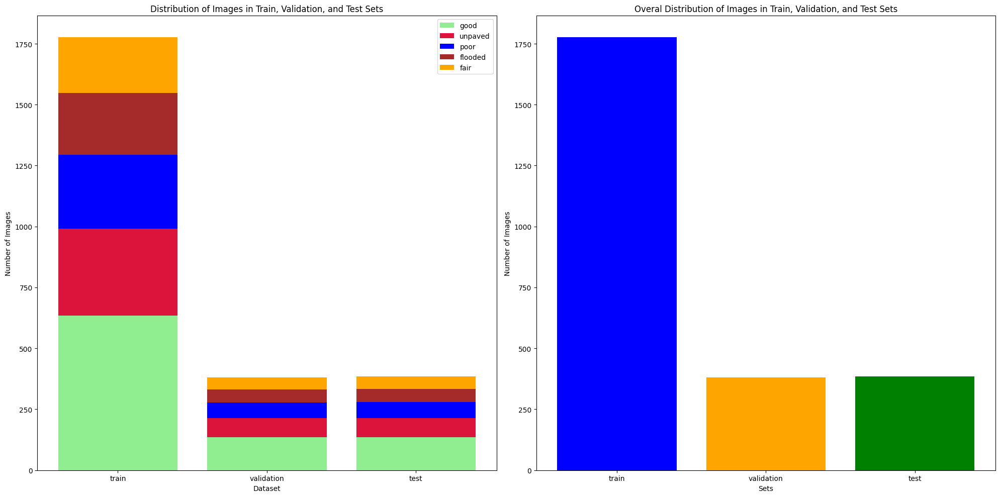

In [34]:

# Initialize dictionary to store counts for each category
category_counts = {category: [] for category in categories}

# Loop through the sets
for _set in sets:   
    set_counts = []
    
    # Loop through the categories
    for category in categories:
        # Count the number of images in the current category for the current set
        category_path = os.path.join(input_path, _set, category)
        count = len([file for file in os.listdir(category_path) if not file.startswith('.')])
        
        set_counts.append(count)
    
    # Append the list of counts for the current set to the dictionary
    for i, category in enumerate(categories):
        category_counts[category].append(set_counts[i])

# Calculate the total counts for each category across all sets
total_counts = {category: sum(counts) for category, counts in category_counts.items()}
sorted_categories = sorted(categories, key=lambda x: total_counts[x], reverse=True)

# Reorder the category counts based on sorted categories
sorted_category_counts = {category: category_counts[category] for category in sorted_categories}

# Customize colors for each category for plotting
category_colors = {
    'fair': 'orange',
    'flooded': 'brown',
    'good': 'lightgreen',
    'unpaved': 'crimson',
    'poor': 'blue'
}

plt.figure(figsize=(20, 10))

# First bar graph
plt.subplot(1, 2, 1)
bar_width = 0.35
bar_positions = range(len(sets))
bottom = [0] * len(sets)
for category in sorted_categories:
    plt.bar(sets, sorted_category_counts[category], label=category, color=category_colors[category], 
            bottom=bottom)
    bottom = [bottom[i] + sorted_category_counts[category][i] for i in range(len(sets))]
plt.xlabel('Dataset')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Train, Validation, and Test Sets')
plt.legend()

# Second bar graph
plt.subplot(1, 2, 2)
# Initialize lists to store the counts
image_counts = []
# Loop through each set (train, validation, test)
for _set in sets:
    # Count the number of images in the current set
    image_count = sum(len(files) for _, _, files in os.walk(os.path.join(input_path, _set)))
    # Append the count to the list
    image_counts.append(image_count)
# Plot the bar graph
plt.bar(sets, image_counts, color=['blue', 'orange', 'green'])
plt.xlabel('Sets')
plt.ylabel('Number of Images')
plt.title('Overal Distribution of Images in Train, Validation, and Test Sets')

plt.tight_layout()
plt.show()


- The distribution of images within the validation and test datasets appears to be balanced, indicating a relatively even spread of images across different categories. This balanced distribution is essential for ensuring that our model receives sufficient representation of each class during training and evaluation. 

<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 3 | Data Preprocessing</strong></p>

In the data preprocessing phase of our road condition classification project, we implement a rigorous process to prepare the image data for optimal model performance. Initially, we identify and remove problematic file extensions that could potentially disrupt the training process, such as GIF files, which are less common and sometimes incompatible with our processing pipeline. We then normalize the image pixel values to a range of 0 to 1 to facilitate model convergence during training. This normalization, along with resizing all images to a uniform dimension of 224x224 pixels, ensures consistency across our dataset. Additionally, we employ data augmentation techniques such as rotations, flips, and shifts to artificially expand our training dataset. This helps prevent overfitting and improves the model's ability to generalize from limited data. Finally, we organize the preprocessed images into train, validation, and test generators, enabling streamlined and efficient data feeding into our neural network models during the training and evaluation phases. This comprehensive preprocessing strategy is critical for enhancing model accuracy and robustness in real-world applications.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 3.1 |</span><span style='color:black; font-size: 16px;'> Removing Problematic Image Extensions </span></b>

In [15]:
"""
# Function to move .gif files to a separate directory
def move_gif_files(source_dir, dest_dir):
    # Create the destination directory if it doesn't exist
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    
    # Move .gif files
    for subdir, dirs, files in os.walk('C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya'):
        for file in files:
            if file.endswith('.gif'):
                src_path = os.path.join(subdir, file)
                dest_path = os.path.join(dest_dir, file)
                shutil.move(src_path, dest_path)
                print(f"Moved: {src_path} to {dest_path}")

# Directories for .gif files
gif_train_dir = 'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//train_gifs'
gif_val_dir = 'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//validation_gifs'
gif_test_dir = 'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//test_gifs'

# Move .gif files from the original directories to the new ones
move_gif_files('C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//train', gif_train_dir)
move_gif_files('C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//validation', gif_val_dir)
move_gif_files('C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//test', gif_test_dir)

"""

'\n# Function to move .gif files to a separate directory\ndef move_gif_files(source_dir, dest_dir):\n    # Create the destination directory if it doesn\'t exist\n    if not os.path.exists(dest_dir):\n        os.makedirs(dest_dir)\n    \n    # Move .gif files\n    for subdir, dirs, files in os.walk(\'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya\'):\n        for file in files:\n            if file.endswith(\'.gif\'):\n                src_path = os.path.join(subdir, file)\n                dest_path = os.path.join(dest_dir, file)\n                shutil.move(src_path, dest_path)\n                print(f"Moved: {src_path} to {dest_path}")\n\n# Directories for .gif files\ngif_train_dir = \'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//train_gifs\'\ngif_val_dir = \'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Kenya//validation_gifs\'\ngif_test_dir = \'C://Users//user//Desktop//Moringa School//Capstone Project//Roads Ke

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 3.2 |</span><span style='color:black; font-size: 16px;'> Data Normalization, Augmentation & Image Resizing </span></b>

In [7]:
# Define Train, Validation & Test Image Datagenerators

train_datagen = ImageDataGenerator(
 rescale = 1/255,
 shear_range=10,
 zoom_range=0.3,
 horizontal_flip=True,
 vertical_flip=True,
 brightness_range=[0.5,2.0],
 width_shift_range = 0.2,
 rotation_range=20,
 fill_mode = 'nearest'
 )
    
val_datagen = ImageDataGenerator(
 rescale = 1/255
 )

test_datagen = ImageDataGenerator(
    rescale = 1/255)

# Define the batch size
batch_size = 32

# Define the target image size
img_height = 224
img_width = 224

# Define the input directories
train_dir = '/kaggle/input/roads-set/train'
val_dir = '/kaggle/input/roads-set/validation'
test_dir = '/kaggle/input/roads-set/test'

# Modify the flow_from_directory calls to skip .gif files
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)




Found 1758 images belonging to 5 classes.
Found 378 images belonging to 5 classes.
Found 383 images belonging to 5 classes.



The dataset has been split into three subsets for training, validation, and testing. Here is a brief overview of the image distribution across these subsets:

**Training Set:**
- Number of Images: **1758**
- Number of Classes: **5**

**Validation Set:**
- Number of Images: **378**
- Number of Classes: **5**

**Testing Set:**
- Number of Images: **383**
- Number of Classes: **5**

In [23]:
# Retrieve class indices from the data generators
class_indices = train_generator.class_indices

# Sort class indices dictionary by values (indices)
sorted_class_indices = sorted(class_indices.items(), key=lambda item: item[1])

# Extract labels from the sorted dictionary
labels = [label for label, index in sorted_class_indices]

print("Order of labels used during training:", labels)

Order of labels used during training: ['fair', 'flooded', 'good', 'poor', 'unpaved']


- Becoming familiar with the class order generated will be crucial for accurately interpreting the predictions from the serialized model.

<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 4 | Modeling
</strong></p>

In the modeling section of our road condition classification project, we explore a range of deep learning architectures to identify the most effective model for accurate and efficient road condition assessment. By experimenting with various pre-trained models such as DenseNet, EfficientNet, VGG16, and ResNet, as well as custom architectures, we aim to leverage their inherent strengths in feature extraction and pattern recognition. Each model undergoes a rigorous evaluation process, where we assess its performance based on metrics such as accuracy, precision, recall, and F1 score. We also consider practical aspects such as training time and model size, which are crucial for deployment in real-world scenarios. Through this systematic approach, we seek to fine-tune and potentially combine these models to achieve optimal performance, ensuring the solution is both robust and scalable for practical applications in road infrastructure management.

In [4]:
# Define a function to streamline the evaluation process across various models

from sklearn.metrics import classification_report, accuracy_score, f1_score, precision_score, recall_score
class_labels = ['good', 'fair','poor', 'flooded', 'unpaved']
def evaluate_model(model, history, test_generator, class_labels):
    # Train and validation loss and accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    
    # Evaluate on test data
    test_loss, test_accuracy = model.evaluate(test_generator)
    print("Test Loss:", test_loss)
    print("Test Accuracy:", test_accuracy)

    # Predict classes for test data
    test_predictions = model.predict(test_generator).argmax(axis=-1)

    # True labels for test data
    test_true_labels = test_generator.classes

    # Calculate metrics
    test_f1 = f1_score(test_true_labels, test_predictions, average='weighted')
    test_precision = precision_score(test_true_labels, test_predictions, average='weighted')
    test_recall = recall_score(test_true_labels, test_predictions, average='weighted')

    # Print metrics
    print("Test F1 Score:", test_f1)
    print("Test Precision:", test_precision)
    print("Test Recall:", test_recall)

    # Plot train/validation loss and accuracy
    epochs = range(1, len(train_loss) + 1)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracy, label='Train Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Plot train vs test accuracy and loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.plot(epochs, [test_loss] * len(epochs), label='Test Loss', linestyle='--')
    plt.title('Train, Validation, and Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracy, label='Train Accuracy')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy')
    plt.plot(epochs, [test_accuracy] * len(epochs), label='Test Accuracy', linestyle='--')
    plt.title('Train, Validation, and Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


- The function evaluate_model serves as a critical component for assessing the performance of various machine learning models utilized in our road condition classification project. It systematically captures and analyzes both the training history and the test results. During the evaluation, we retrieve training and validation loss and accuracy from the model's training sessions to visualize and track the learning progression over epochs. The model is then evaluated on the test set to determine its effectiveness on unseen data, where we calculate both the test loss and test accuracy. Predictions are also generated for the test data, enabling us to comprehensively assess model performance using metrics such as the F1 score, precision, and recall. These metrics provide insights into the model's ability to accurately classify the road conditions, which are crucial for ensuring the robustness and scalability of our deployment solution in managing road infrastructure.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.1 |</span><span style='color:black; font-size: 16px;'> Baseline Model: CNN </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.1.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [57]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define input shape

input_shape = (224,224,3)

# Create a sequential model

baseline_model = Sequential ([
    Conv2D(32, (3,3), activation = 'relu', input_shape = input_shape),
    MaxPooling2D((2,2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(5, activation='softmax')
])

# compile the model
baseline_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#print model summary
baseline_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,605 (42.61 MB)

 Trainable params: 11,169,605 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

**Overview:**

- Layer Details: This model comprises a series of convolutional layers each followed by max pooling layers, designed to progressively extract and condense features from the input images. 
- The architecture unfolds as follows:
    * Three Convolutional Layers: Helps in capturing various features from simple to complex by increasing the depth from 32, 64, to 128 filters.
    * Three Max Pooling Layers: Each corresponding to a convolutional layer to reduce spatial dimensions, thereby speeding up computation and reducing overfitting.
    * Flatten Layer: Converts the 3D feature maps into a 1D vector to prepare data for the fully connected layers.
    * Dense Layers: A dense layer with 128 neurons to interpret features, followed by a dropout layer to prevent overfitting, and a final dense layer with 5 outputs corresponding to the class probabilities.
    * Total Parameters: 11,169,605, indicating a deep network capable of learning detailed and complex patterns in the data.
    * Model Size: 42.61 MB, making it substantial yet manageable for modern computation resources.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.1.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [58]:
start = datetime.datetime.now()

In [59]:
# Train the model
history = baseline_model.fit(
        train_generator,
        epochs=30,
        validation_data=validation_generator,
        verbose=1
    )
 
# Evaluate on validation set
validation_loss, validation_accuracy = baseline_model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)
 
# Evaluate on test set
test_loss, test_accuracy = baseline_model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 61s 909ms/step - accuracy: 0.2938 - loss: 3.9672 - val_accuracy: 0.3519 - val_loss: 15.3460
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 916ms/step - accuracy: 0.3468 - loss: 21.4338 - val_accuracy: 0.3519 - val_loss: 5.1372
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 908ms/step - accuracy: 0.3758 - loss: 2.5118 - val_accuracy: 0.3519 - val_loss: 6.1427
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 907ms/step - accuracy: 0.3567 - loss: 2.7329 - val_accuracy: 0.3519 - val_loss: 5.8564
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 82s 904ms/step - accuracy: 0.3528 - loss: 2.9968 - val_accuracy: 0.4180 - val_loss: 1.4274
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 911ms/step - accuracy: 0.3566 - loss: 4.7346 - val_accuracy: 0.3704 - val_loss: 10.7356
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 902ms/step - accuracy: 0.3496 - loss: 7.5494 - val_accuracy: 0.3704 - val_loss: 2.0320
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 910ms/step - accuracy: 0.3570 - loss: 2.6720 - val_a

2024-04-18 16:21:28.717236: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 5.07642, expected 4.43595
2024-04-18 16:21:28.717318: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180: 5.23389, expected 4.59342
2024-04-18 16:21:28.717328: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 197: 5.03202, expected 4.39155
2024-04-18 16:21:28.717339: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 627: 5.38588, expected 4.74541
2024-04-18 16:21:28.717348: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 999: 5.39291, expected 4.75244
2024-04-18 16:21:28.717359: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1510: 4.75906, expected 4.11859
2024-04-18 16:21:28.717373: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2837: 5.36889, expected 4.72842
2024-04-18 16:21:28.717382: E external/l

Test Loss: 1.0662895441055298
Test Accuracy: 0.5900783538818359


In [61]:
end = datetime.datetime.now()

elapsed = end - start

print('Baseline Model Training time:', elapsed)

Baseline Model Training time: 0:28:42.957484


12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 530ms/step - accuracy: 0.4741 - loss: 1.1981
Test Loss: 1.0662895441055298
Test Accuracy: 0.5900783538818359
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 537ms/step
Test F1 Score: 0.5554645089710856
Test Precision: 0.6335904968599065
Test Recall: 0.5900783289817232


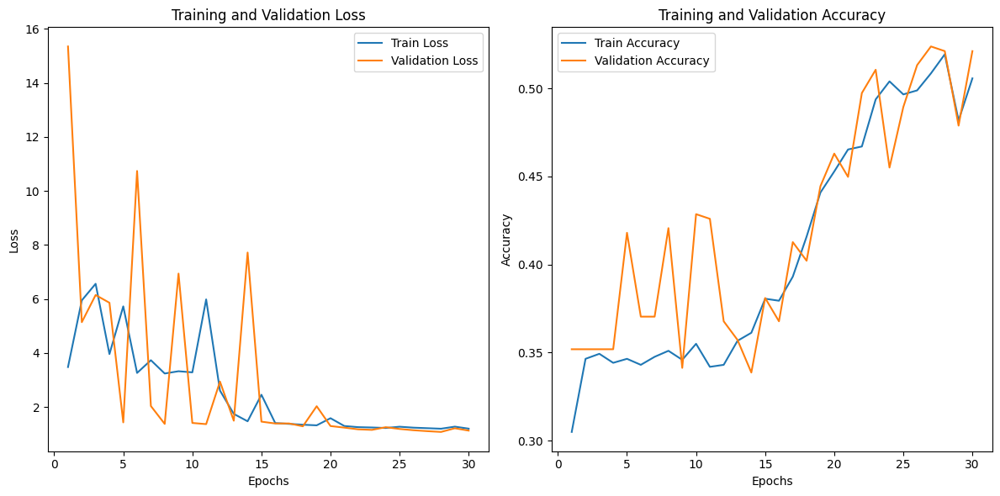

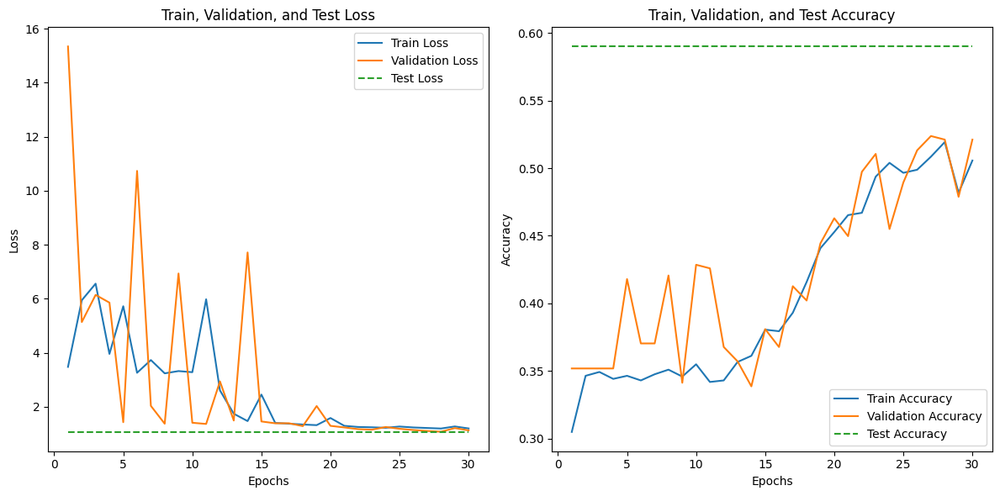

In [62]:
evaluate_model(baseline_model, history, test_generator, class_labels)

We can infer the following:

* Moderate Accuracy: The test accuracy of approximately **59.01%** suggests that while the baseline model can correctly classify over half of the data, there is significant room for improvement. This level of accuracy might be adequate for initial assessments but is generally considered suboptimal for practical applications that demand high reliability.
* Moderate Test Loss: The test loss of **1.0663** indicates that there is a notable difference between the model’s predictions and the actual labels, suggesting room for improvement in model tuning and potentially data preprocessing to enhance the model's predictive accuracy.
* F1 Score **(55.55%)**: The F1 score, a balance of precision and recall, is moderate, indicating that the model is neither exceptionally good nor poor at balancing false positives and false negatives. While not critically low, this score highlights the need for further optimization to enhance both precision and recall.
* Inference Time and Efficiency: The inference times of approximately 530 ms per step, totaling about **24:42 mins** for 30 epochs, indicate a reasonable level of efficiency.

In [64]:
# save the model to file
# baseline_model.save('baseline_model.h5')

In [65]:
loaded_baseline = tf.keras.models.load_model('baseline_model.h5')

In [69]:
loss, accuracy = loaded_baseline.evaluate(test_generator)

12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 606ms/step - accuracy: 0.4741 - loss: 1.1981


<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.2 |</span><span style='color:black; font-size: 16px;'> Different Architecture CNN Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.2.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [70]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

# Create a Sequential model
cnn_architecture_2 = Sequential(name='CNN_Architecture_2')

# Add convolutional layers with increasing filter sizes
cnn_architecture_2.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
cnn_architecture_2.add(MaxPooling2D((2, 2)))
cnn_architecture_2.add(Conv2D(64, (3, 3), activation='relu'))
cnn_architecture_2.add(MaxPooling2D((2, 2)))
cnn_architecture_2.add(Conv2D(128, (3, 3), activation='relu'))
cnn_architecture_2.add(MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_architecture_2.add(Flatten())

# Add dense layers with increasing units
cnn_architecture_2.add(Dense(128, activation='relu'))
cnn_architecture_2.add(Dropout(0.5))  # Add dropout for regularization
cnn_architecture_2.add(Dense(64, activation='relu'))
cnn_architecture_2.add(Dropout(0.5))  # Add dropout for regularization

# Output layer with softmax activation for multi-class classification
num_classes = 5  # Adjust based on the number of classes in your problem
cnn_architecture_2.add(Dense(num_classes, activation='softmax'))

# Compile the model
cnn_architecture_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print concise model summary
cnn_architecture_2.summary()

Model: "CNN_Architecture_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,177,541 (42.64 MB)

 Trainable params: 11,177,541 (42.64 MB)

 Non-trainable params: 0 (0.00 B)

**Overview:** 

- Layer Details: This model features a sequential arrangement of convolutional layers paired with max pooling layers, effectively designed to incrementally extract detailed features from input images.
- Architecture Unfolds As Follows:
 * Three Convolutional Layers: Optimized to progressively capture a range of features, from simple to more complex, by utilizing filters that increase in number from 32, to 64, to 128. This helps the model in understanding varied aspects of the image data.
 * Three Max Pooling Layers: Each positioned after a convolutional layer, these layers work to reduce the spatial dimensions of the feature maps, which helps in decreasing the computational load and mitigating the risk of overfitting.
 * Flatten Layer: Transforms the multi-dimensional output of the last pooling layer into a one-dimensional array, making it possible to feed this data into the dense layers that follow.
 * Dense Layers and Dropout: Includes a dense layer with 128 neurons, enhanced by a dropout layer to prevent overfitting. This is followed by another dense layer with 64 neurons, also paired with a dropout layer, culminating in a final dense layer that outputs the classification results across five categories.
 * Total Parameters: 11,177,541, signifying a deeply layered network that can learn nuanced patterns within the data.
 * Model Size: 42.64 MB, indicating a robust model that remains efficient enough for deployment in scenarios with adequate computational resources.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.2.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [71]:
start = datetime.datetime.now()

In [72]:
# Train the model
history = cnn_architecture_2.fit(
        train_generator,
        epochs=30,
        validation_data=validation_generator,
        verbose=1
    )
 
# Evaluate on validation set
validation_loss, validation_accuracy = cnn_architecture_2.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)
 
# Evaluate on test set
test_loss, test_accuracy = cnn_architecture_2.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.2651 - loss: 3.6405 - val_accuracy: 0.3519 - val_loss: 13.5694
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 909ms/step - accuracy: 0.3522 - loss: 5.6370 - val_accuracy: 0.4074 - val_loss: 1.4723
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 897ms/step - accuracy: 0.3508 - loss: 4.9329 - val_accuracy: 0.3519 - val_loss: 13.0734
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 904ms/step - accuracy: 0.3424 - loss: 13.7310 - val_accuracy: 0.3519 - val_loss: 6.3921
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 55s 886ms/step - accuracy: 0.3562 - loss: 6.1455 - val_accuracy: 0.3519 - val_loss: 5.1191
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 54s 881ms/step - accuracy: 0.3595 - loss: 2.3961 - val_accuracy: 0.4153 - val_loss: 1.4161
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 55s 893ms/step - accuracy: 0.3654 - loss: 1.8345 - val_accuracy: 0.4206 - val_loss: 1.4345
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 54s 887ms/step - accuracy: 0.3543 - loss: 1.6456 - val_accu

In [73]:
end = datetime.datetime.now()

elapsed = end - start

print('CNN Architecture 2 Training Time:', elapsed)

CNN Architecture 2 Training Time: 0:27:47.540223


12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 503ms/step - accuracy: 0.5619 - loss: 1.3978
Test Loss: 1.3792686462402344
Test Accuracy: 0.4725848436355591
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 498ms/step
Test F1 Score: 0.36705584498111143
Test Precision: 0.308961208349794
Test Recall: 0.4725848563968668


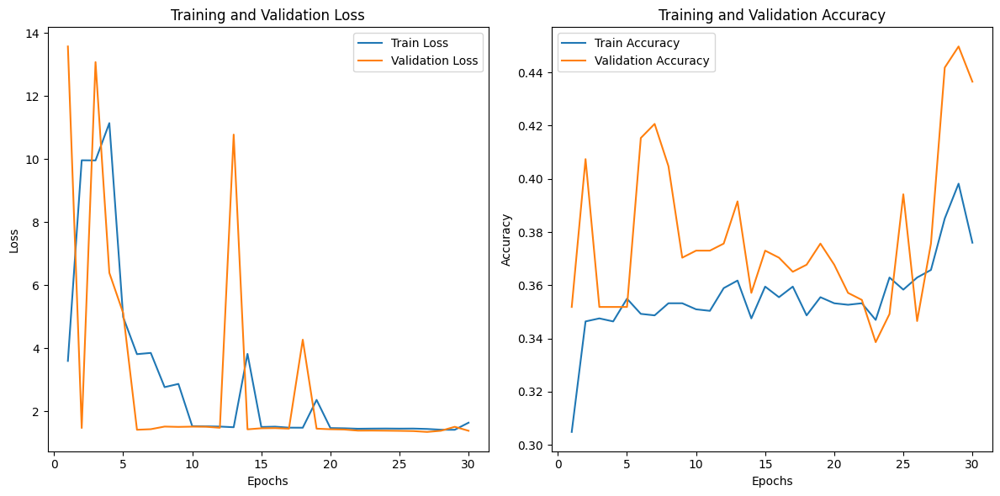

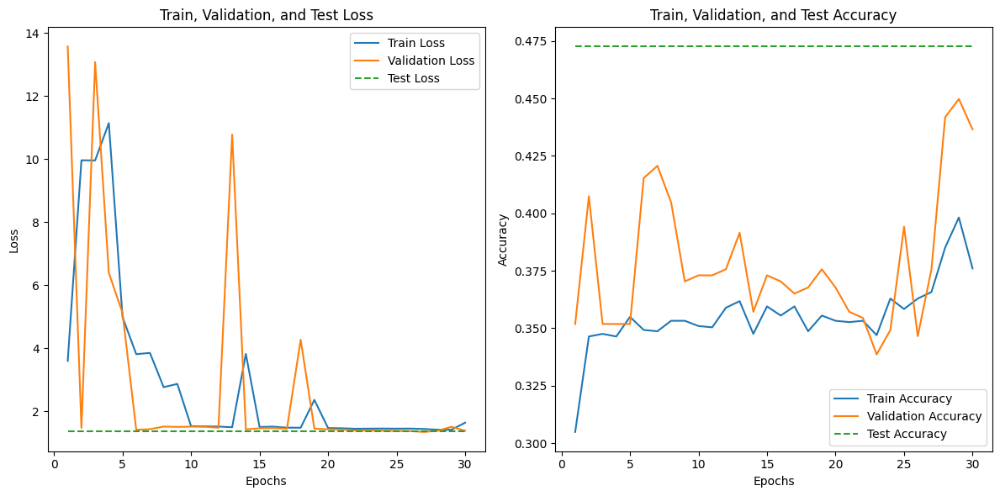

In [75]:
evaluate_model(cnn_architecture_2, history, test_generator, class_labels)

We can infer the following:

* Model performance decreased with a more complex CNN architecture compared to the baseline, suggesting that the additional complexity might have led to overfitting, where the model learns noise and details in the training data to an extent that negatively impacts its performance on new, unseen data. This indicates that a simpler model might be more effective and efficient for this particular dataset.
* Moderate to High Test Loss: A test loss of **1.3793** suggests that the model’s predictions often deviate significantly from the actual labels, indicating a potential mismatch between the model’s outputs and the expected outcomes, or an overall inability to model the dataset effectively.
* Low Accuracy: The test accuracy of **47.26%** highlights that the model struggles to classify the data correctly. This accuracy level is typically insufficient for most practical applications, especially in scenarios where reliable or precise predictions are critical.
* Low F1 Score (36.71%): The F1 score being quite low reflects poor model performance in terms of precision and recall balance. It indicates that the model is not effectively managing the trade-off between false positives and false negatives.
* Inference Time and Efficiency: The inference times of 503 ms per step, accumulating to a total of **27:47 mins** for 30 epochs indicates reasonable efficiency, especially for models involving complex computations or large datasets.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.3 |</span><span style='color:black; font-size: 16px;'> VGG16 Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.3.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [15]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

# Load pre-trained VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in vgg_model.layers:
    layer.trainable = False

# Create a Sequential model
imageNET_model = Sequential(name='VGG16_ImageNet')

# Add the pre-trained VGG16 model to the Sequential model
imageNET_model.add(vgg_model)

# Add global average pooling layer to reduce parameters
imageNET_model.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
imageNET_model.add(Dense(64, activation='relu'))

# Add dropout layer
imageNET_model.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
# Number of units should be equal to the number of classes
num_classes = 5  # 5 classes (e.g., good, fair, poor, flooded, unpaved)
imageNET_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
imageNET_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
imageNET_model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "VGG16_ImageNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ ?                      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

**Overview:** 

- Layer Details: This model utilizes the VGG16 architecture, a highly reputable deep convolutional neural network known for its effectiveness in large-scale image recognition tasks. The VGG16 base is pre-trained on the ImageNet dataset, providing a robust foundation for feature extraction.
- Architecture Unfolds As Follows:
 * VGG16 Base (Functional): Comprises multiple convolutional layers that are finely tuned for capturing complex image features. The exact architecture entails successive convolution layers with increasing filters and max pooling layers that condense the spatial dimensions, enabling the network to capture the most informative features from images.
 * Global Average Pooling Layer: This layer follows the VGG16 base to reduce each feature map to a single number by averaging out spatial dimensions, which simplifies the output while retaining important spatial hierarchies.
 * Dense and Dropout Layers: After flattening the feature outputs, the model includes a dense layer (whose specific details are unbuilt in the summary) intended for classification, coupled with a dropout layer to prevent overfitting. A final dense layer, also unbuilt in the summary, outputs the classification results.
 * Total Parameters: 14,714,688, which underscores the model's extensive learning capacity, derived mostly from the pre-trained VGG16 structure.
 * Model Size: 56.13 MB, indicating a substantial model that leverages the computational power required for training and inference based on deep and wide neural networks.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.3.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [26]:
start = datetime.datetime.now()

In [27]:
history = imageNET_model.fit(
        train_generator,
        epochs=30,
        validation_data=validation_generator,
        verbose=1
    )
 
# Evaluate on validation set
validation_loss, validation_accuracy = imageNET_model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)
 
# Evaluate on test set
test_loss, test_accuracy = imageNET_model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30


2024-04-14 14:18:17.718558: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.63498, expected 3.85968
2024-04-14 14:18:17.718629: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.55784, expected 5.78254
2024-04-14 14:18:17.718639: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 6.61282, expected 5.83752
2024-04-14 14:18:17.718647: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.34499, expected 5.56968
2024-04-14 14:18:17.718654: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 6.25159, expected 5.47629
2024-04-14 14:18:17.718662: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 5.43964, expected 4.66434
2024-04-14 14:18:17.718671: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 9: 6.54333, expected 5.76803
2024-04-14 14:18:17.718679: E external/local_xla/xla/se

49/55 ━━━━━━━━━━━━━━━━━━━━ 5s 942ms/step - accuracy: 0.2767 - loss: 1.6018

2024-04-14 14:19:20.330787: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 5.1593, expected 4.2307
2024-04-14 14:19:20.330865: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50177: 5.27465, expected 4.34605
2024-04-14 14:19:20.330881: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50178: 6.22507, expected 5.29647
2024-04-14 14:19:20.330895: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50179: 6.11698, expected 5.18838
2024-04-14 14:19:20.330905: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50180: 5.57882, expected 4.65022
2024-04-14 14:19:20.330915: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50181: 5.26032, expected 4.33172
2024-04-14 14:19:20.330925: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50182: 5.05778, expected 4.12918
2024-04-14 14:19:20.330936: E

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2847 - loss: 1.5887

2024-04-14 14:19:43.944678: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.46443, expected 2.59124
2024-04-14 14:19:43.944741: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.84232, expected 3.96913
2024-04-14 14:19:43.944751: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.91526, expected 4.04207
2024-04-14 14:19:43.944758: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 5.02814, expected 4.15494
2024-04-14 14:19:43.944766: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.53562, expected 3.66243
2024-04-14 14:19:43.944774: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 4.79722, expected 3.92403
2024-04-14 14:19:43.944783: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.69349, expected 3.82029
2024-04-14 14:19:43.944791: E external/local_xla/xla/se

55/55 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - accuracy: 0.2859 - loss: 1.5867 - val_accuracy: 0.5212 - val_loss: 1.2138
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 995ms/step - accuracy: 0.4999 - loss: 1.2460 - val_accuracy: 0.6640 - val_loss: 1.0214
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 992ms/step - accuracy: 0.5467 - loss: 1.1480 - val_accuracy: 0.7169 - val_loss: 0.9202
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.6152 - loss: 1.0511 - val_accuracy: 0.7249 - val_loss: 0.8506
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 999ms/step - accuracy: 0.6333 - loss: 0.9951 - val_accuracy: 0.7354 - val_loss: 0.8109
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 61s 992ms/step - accuracy: 0.6530 - loss: 0.9390 - val_accuracy: 0.7328 - val_loss: 0.7607
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.6563 - loss: 0.9224 - val_accuracy: 0.7354 - val_loss: 0.7442
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 997ms/step - accuracy: 0.6365 - loss: 0.9412 - val_accuracy: 0.7302 - val_

2024-04-14 14:51:07.514067: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100352: 3.62212, expected 2.70127
2024-04-14 14:51:07.514131: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100353: 5.31563, expected 4.39477
2024-04-14 14:51:07.514140: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100354: 5.43093, expected 4.51007
2024-04-14 14:51:07.514148: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100355: 5.35723, expected 4.43638
2024-04-14 14:51:07.514156: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100356: 5.06878, expected 4.14793
2024-04-14 14:51:07.514164: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100357: 5.791, expected 4.87014
2024-04-14 14:51:07.514171: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100358: 5.23388, expected 4.31303
2024-04-14 14:51:07.51

Test Loss: 0.5673136115074158
Test Accuracy: 0.7728459239006042


In [31]:
end = datetime.datetime.now()

elapsed = end - start

print('VGG16 Model Training time:', elapsed)

VGG16 Model Training time: 0:33:29.243873


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 547ms/step - accuracy: 0.8004 - loss: 0.5075
Test Loss: 0.5673136115074158
Test Accuracy: 0.7728459239006042
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 546ms/step
Test F1 Score: 0.7701837005486802
Test Precision: 0.7786660489341594
Test Recall: 0.7728459530026109


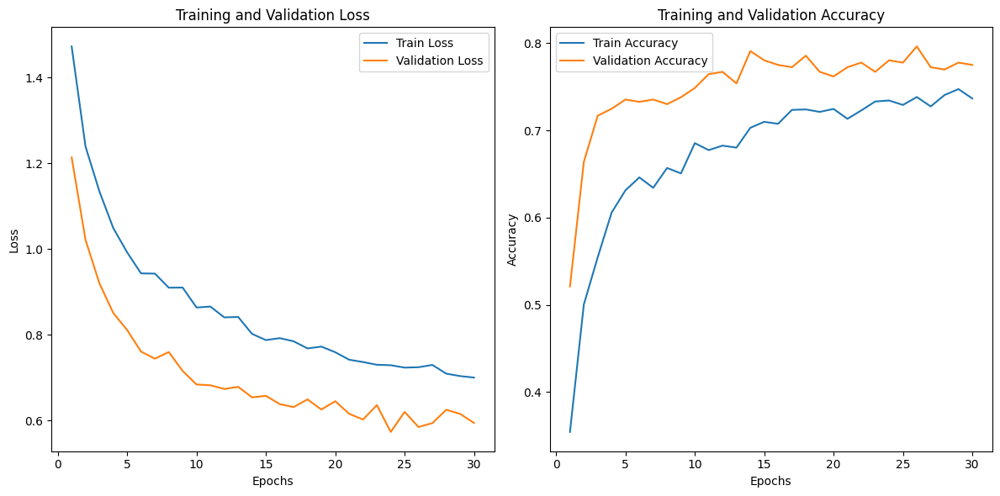

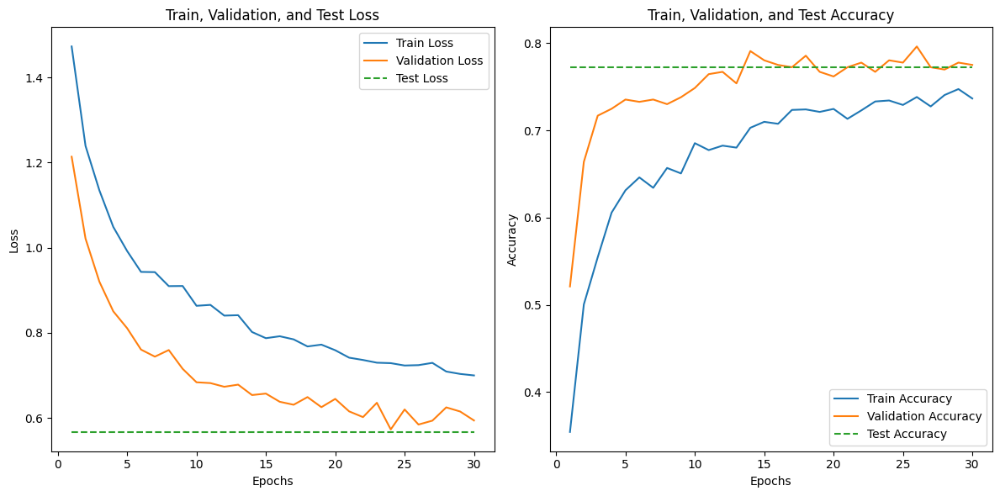

In [32]:
evaluate_model(imageNET_model, history, test_generator, class_labels)

We can infer the following: 

- The VGG16 model achieved a test accuracy of approximately **77.28%**, indicating its ability to correctly classify around 77.28% of the test samples.
- Test F1 score, precision, and recall were also around **77.02%, 77.87%, and 77.28%**, respectively, providing a comprehensive evaluation of the model's performance across all classes.
- The model's performance on the validation set was similar, with a validation accuracy of approximately **77.51%** and a validation loss of approximately **0.594**.
- These results suggest that the VGG16 model generalizes well to unseen data, maintaining consistent performance between the test and validation sets.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.4 |</span><span style='color:black; font-size: 16px;'> DenseNET Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.4.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [6]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

input_shape = (224,224,3)
# Load pre-trained DenseNet121 model
densenet_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in densenet_model.layers:
    layer.trainable = False

# Create a Sequential model
densenet_custom_model = Sequential(name='DenseNet_Custom')

# Add the pre-trained DenseNet model to the Sequential model
densenet_custom_model.add(densenet_model)

# Add global average pooling layer to reduce parameters
densenet_custom_model.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
densenet_custom_model.add(Dense(64, activation='relu'))

# Add dropout layer
densenet_custom_model.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
# Number of units should be equal to the number of classes
num_classes = 5  # 5 classes (e.g., good, fair, poor, flooded, unpaved)
densenet_custom_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
densenet_custom_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
densenet_custom_model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "DenseNet_Custom"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ ?                      │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 7,037,504 (26.85 MB)

**Overview:**

- Layer Details: This model leverages the DenseNet121 architecture, a densely connected convolutional network known for its efficiency and effectiveness in feature reuse and propagation, making it ideal for image recognition tasks. The DenseNet121 is pre-trained, allowing it to serve as a solid foundation for extracting complex image features with fewer parameters than many other deep architectures.
- Architecture Unfolds As Follows:
 * DenseNet121 Base (Functional): Composed of densely connected convolutional layers that ensure maximum information flow between layers in the network. This configuration helps in reducing the number of parameters while maintaining the performance which is beneficial for both training speed and performance.
 * Global Average Pooling Layer: Follows the DenseNet121 base, which averages out the spatial information, reducing each feature map to a single value. This reduction helps in minimizing overfitting and also reduces the model's complexity.
 * Dense and Dropout Layers: Incorporates a dense layer for feature interpretation (details unspecified as 'unbuilt' in the summary) followed by a dropout layer to reduce overfitting risks during training. A subsequent dense layer (also unbuilt) is designed to produce the final output for classification.
 * Total Parameters: 7,037,504, demonstrating an efficient use of parameters that DenseNet architectures are known for.
 * Model Size: 26.85 MB, relatively lighter compared to other complex models, making it advantageous for deployment in environments with limited computational resources.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.4.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [7]:
# Start model training time measurement
start = datetime.datetime.now()

In [8]:
# Fit the model
history = densenet_custom_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1
)

# Evaluate on validation set
validation_loss, validation_accuracy = densenet_custom_model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

# Evaluate on test set
test_loss, test_accuracy = densenet_custom_model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
 2/55 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.2656 - loss: 2.1871  

I0000 00:00:1713464013.203161     104 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


55/55 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.3499 - loss: 1.6413 - val_accuracy: 0.6905 - val_loss: 0.9238
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 902ms/step - accuracy: 0.6115 - loss: 1.0558 - val_accuracy: 0.7831 - val_loss: 0.7082
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 55s 886ms/step - accuracy: 0.6617 - loss: 0.8739 - val_accuracy: 0.7910 - val_loss: 0.6563
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 903ms/step - accuracy: 0.6805 - loss: 0.8049 - val_accuracy: 0.8254 - val_loss: 0.5617
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 55s 884ms/step - accuracy: 0.7198 - loss: 0.7681 - val_accuracy: 0.8175 - val_loss: 0.5002
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 897ms/step - accuracy: 0.7537 - loss: 0.6679 - val_accuracy: 0.8492 - val_loss: 0.4740
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 57s 937ms/step - accuracy: 0.7759 - loss: 0.6378 - val_accuracy: 0.8386 - val_loss: 0.4769
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 58s 936ms/step - accuracy: 0.7692 - loss: 0.6298 - val_accuracy: 0.8360 

In [9]:
# End model training time measurement
end = datetime.datetime.now()
elapsed = end - start
print('DenseNet Model Training time:', elapsed)

DenseNet Model Training time: 0:30:54.751114


12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 512ms/step - accuracy: 0.8928 - loss: 0.2792
Test Loss: 0.2687988579273224
Test Accuracy: 0.9112271666526794
12/12 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step 
Test F1 Score: 0.9102630384171216
Test Precision: 0.9123541214309822
Test Recall: 0.9112271540469974


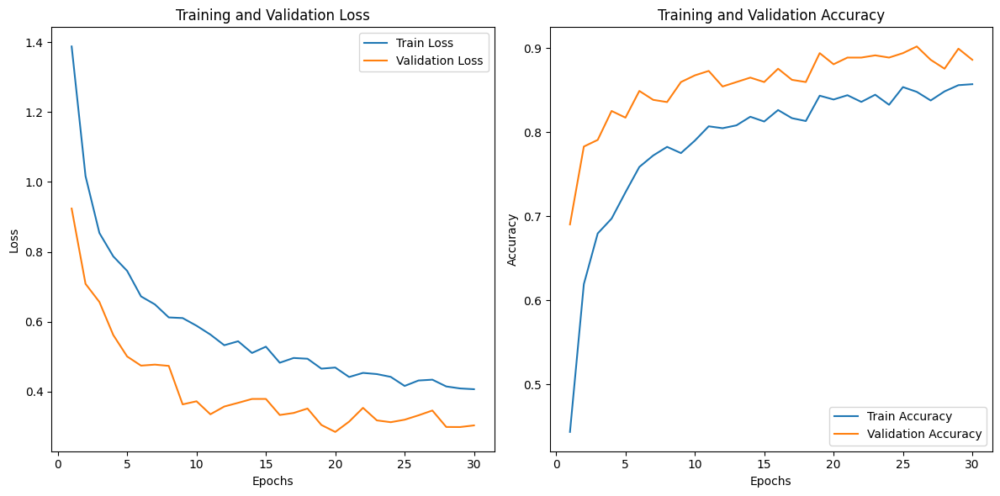

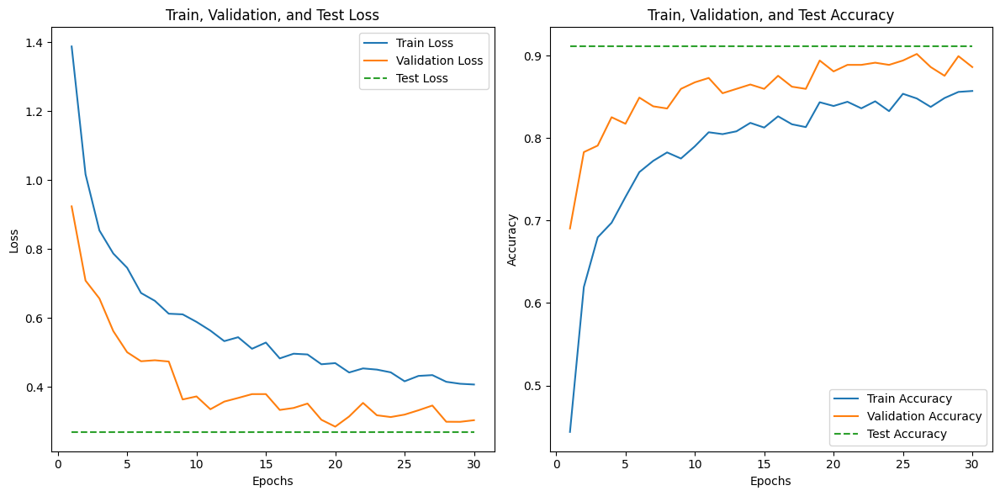

In [10]:
# Evaluation metrics calculation
evaluate_model(densenet_custom_model, history, test_generator, class_labels)

1. **Model Performance Improvement Over Time**:
   - The training and validation accuracy consistently improve over epochs, indicating that the model learns effectively from the training data.
   - The validation accuracy reaches approximately **88.6%** by the end of training, suggesting that the model generalizes well to unseen validation data.

2. **Test Performance**:
   - The test accuracy is approximately **91.12%**, demonstrating the model's ability to classify unseen test samples with high accuracy.
   - The test loss of **26.88%** is relatively low, indicating that the model's predictions are close to the actual values.

3. **Evaluation Metrics**:
   - The F1 score, precision, and recall values are high, all around **91.02%, 91.23%, and 91.12%** respectively. This suggests that the model performs well across all classes, achieving a balance between precision and recall.

4. **Consistency Between Validation and Test Performance**:
   - The validation and test accuracies are close, indicating that the model generalizes well to unseen data.
   - The slight drop in test accuracy compared to validation accuracy is expected but is not significant, suggesting that the model's performance remains consistent across different datasets.

5. **Model Efficiency**:
   - The DenseNet model achieves high accuracy with relatively fewer parameters compared to some other architectures, indicating its efficiency in utilizing network parameters.

In [28]:
# zip the saved model directory for download to pc
# shutil.make_archive('dense', 'zip', '/kaggle/working/dense')

'/kaggle/working/dense.zip'

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.4.3 |</span><span style='color:black; font-size: 16px;'> Tuning DenseNET Model </span></b>

In [57]:
start = datetime.datetime.now()

In [58]:
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping

# Define a function to schedule the learning rate
def lr_scheduler(epoch):
    if epoch < 10:
        return 0.001
    elif epoch < 20:
        return 0.0001
    else:
        return 0.00001

# Define the LearningRateScheduler callback
learning_rate_scheduler = LearningRateScheduler(lr_scheduler)

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with the learning rate scheduler and early stopping callbacks
history = densenet_custom_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[learning_rate_scheduler, early_stopping]
)


Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 114s 2s/step - accuracy: 0.5019 - loss: 1.2747 - val_accuracy: 0.7302 - val_loss: 0.7970 - learning_rate: 0.0010
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.6143 - loss: 0.9734 - val_accuracy: 0.7804 - val_loss: 0.6533 - learning_rate: 0.0010
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.6815 - loss: 0.8251 - val_accuracy: 0.7989 - val_loss: 0.5547 - learning_rate: 0.0010
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.7143 - loss: 0.7412 - val_accuracy: 0.8254 - val_loss: 0.4976 - learning_rate: 0.0010
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7672 - loss: 0.6810 - val_accuracy: 0.8439 - val_loss: 0.4694 - learning_rate: 0.0010
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7414 - loss: 0.6923 - val_accuracy: 0.8492 - val_loss: 0.4340 - learning_rate: 0.0010
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7617 - loss: 0.6046 - val_accuracy:

In [67]:
end = datetime.datetime.now()

elapsed = end - start

print('DenseNet Model (Tuned) Training time:', elapsed)

DenseNet Model (Tuned) Training time: 0:35:54.435606


12/12 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.8841 - loss: 0.3318 
Test Loss: 0.32686570286750793
Test Accuracy: 0.9007833003997803
12/12 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step 
Test F1 Score: 0.900208114626526
Test Precision: 0.9040013054830288
Test Recall: 0.9007832898172323


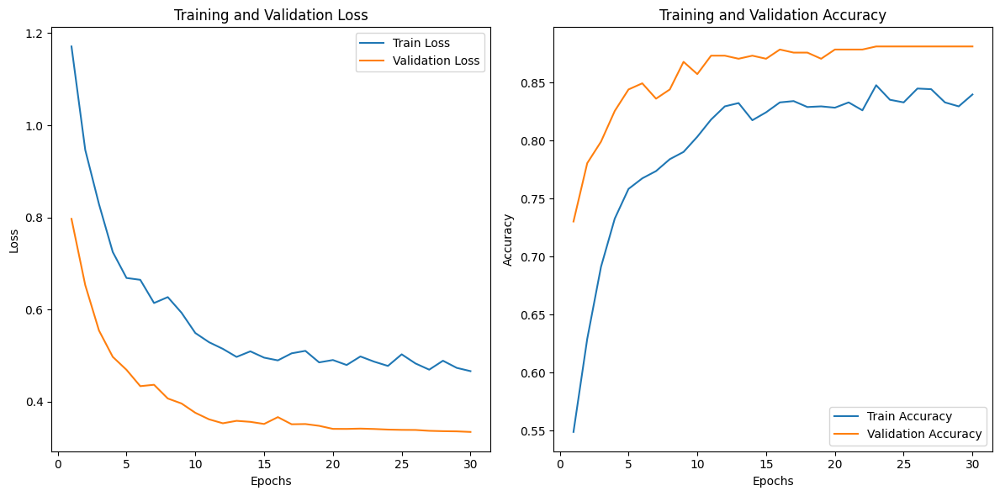

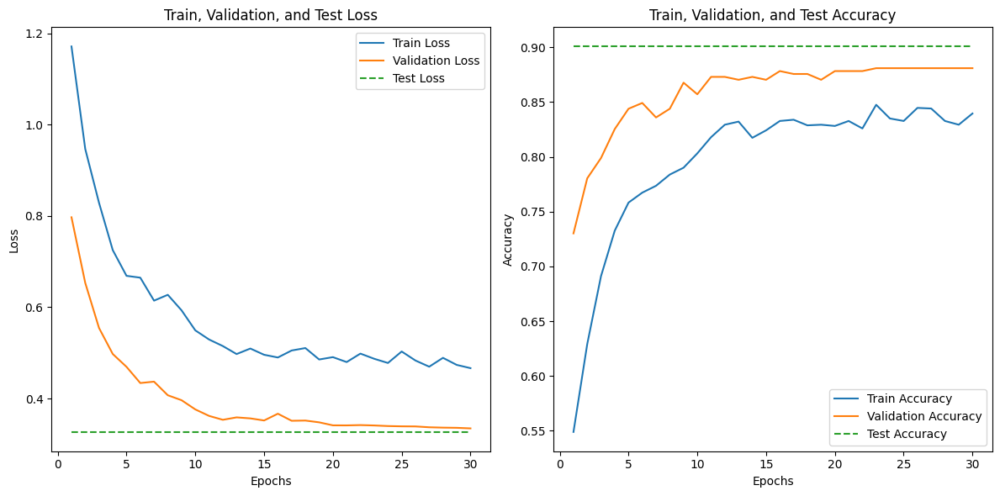

In [68]:
# Evaluation metrics calculation
evaluate_model(densenet_custom_model, history, test_generator, class_labels)

We can infer the following: 

* Adjusting the learning rate led to a decrease in model performance, which suggests that the original DenseNet configuration was already well-optimized for this classification task.
* High Accuracy: The test accuracy of approximately **90.08%** suggests that the model is highly effective at correctly identifying the correct road conditions. This level of accuracy is excellent for practical applications where reliable classification is crucial.
* Moderate Test Loss: The test loss of **0.3269** is reasonably low, indicating that the model’s predictions are generally close to the actual labels. Lower loss values suggest that the model architecture is well-suited to the task, and the training process has been effective.
* F1 Score **(90.02%)**: This score is high, reflecting robust overall model performance in terms of both precision and recall. The F1 score is crucial for understanding how well the model balances the precision and recall, which in this case indicates that the model effectively manages false positives and false negatives.
* Inference Time and Efficiency: The inference times of approximately 2 seconds per step, totaling about **35:54 mins** for 30 epochs, indicate that the model operates within an acceptable range of computational efficiency. This level of efficiency is suitable for deployments where moderate delay is tolerable.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.5 |</span><span style='color:black; font-size: 16px;'> EfficientNETB0 Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.5.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [17]:
import datetime
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

# Define input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

# Load pre-trained EfficientNetB0 model
efficientnet_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in efficientnet_model.layers:
    layer.trainable = False

# Create a Sequential model
model = Sequential(name='EfficientNetB0')

# Add the pre-trained EfficientNetB0 model to the Sequential model
model.add(efficientnet_model)

# Add global average pooling layer to reduce parameters
model.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
model.add(Dense(64, activation='relu'))

# Add dropout layer
model.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
# Number of units should be equal to the number of classes
num_classes = 5  # 5 classes (e.g., good, fair, poor, flooded, unpaved)
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print concise model summary
print("Model: EfficientNetB0")
model.summary()

Model: EfficientNetB0


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ ?                      │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 4,049,571 (15.45 MB)

**Overview:**

- Layer Details: This model is based on the EfficientNetB0 architecture, which is renowned for its balanced scaling of depth, width, and resolution to achieve high accuracy with a significantly lower number of parameters compared to other models of similar capability. EfficientNetB0 is particularly designed for efficiency, allowing it to perform exceptionally well on hardware with limited resources.
- Architecture Unfolds As Follows:
 * EfficientNetB0 Base (Functional): This base model utilizes a compound scaling method that optimizes the network’s dimensions comprehensively, enhancing its ability to process varied image features effectively.
 * Global Average Pooling Layer: Implements global average pooling immediately following the EfficientNetB0 base, which helps in reducing each of the feature maps to a single vector, thus simplifying the model output while retaining essential information.
 * Dense and Dropout Layers: Features a dense layer intended for output classification, which is currently unspecified as 'unbuilt' in the summary, followed by a dropout layer to aid in mitigating overfitting during the training phase. Another dense layer for final output classification is also planned but not yet built.
 * Total Parameters: 4,049,571, which underscores the model's efficiency in parameter usage, making it suitable for environments with stringent computational and memory constraints.
 * Model Size: 15.45 MB, which is relatively light and favorable for deployment in mobile or edge devices where memory and processing power are limited.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.5.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [18]:
start = datetime.datetime.now()

In [23]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1
)

# Evaluate on validation set
validation_loss, validation_accuracy = model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

# Evaluate on test set
test_loss, test_accuracy = model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 1/55 ━━━━━━━━━━━━━━━━━━━━ 40:58 46s/step - accuracy: 0.3438 - loss: 1.5934

I0000 00:00:1713295795.240056     678 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


55/55 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.3519 - loss: 1.5569 - val_accuracy: 0.3519 - val_loss: 1.5460
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 63s 996ms/step - accuracy: 0.3543 - loss: 1.5519 - val_accuracy: 0.3519 - val_loss: 1.5430
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.3382 - loss: 1.5616 - val_accuracy: 0.3519 - val_loss: 1.5381
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.3663 - loss: 1.5406 - val_accuracy: 0.3519 - val_loss: 1.5389
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.3606 - loss: 1.5376 - val_accuracy: 0.3519 - val_loss: 1.5416
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 995ms/step - accuracy: 0.3412 - loss: 1.5526 - val_accuracy: 0.3519 - val_loss: 1.5382
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.3533 - loss: 1.5454 - val_accuracy: 0.3519 - val_loss: 1.5398
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.3653 - loss: 1.5374 - val_accuracy: 0.3519 - val_loss: 1.5

In [25]:
end = datetime.datetime.now()
elapsed = end - start
print('EfficientNet Model Training time:', elapsed)

EfficientNet Model Training time: 0:38:26.613418


12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 640ms/step - accuracy: 0.3088 - loss: 1.6481
Test Loss: 1.539074420928955
Test Accuracy: 0.352480411529541
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 610ms/step
Test F1 Score: 0.18372531427361716
Test Precision: 0.12424244490043561
Test Recall: 0.3524804177545692


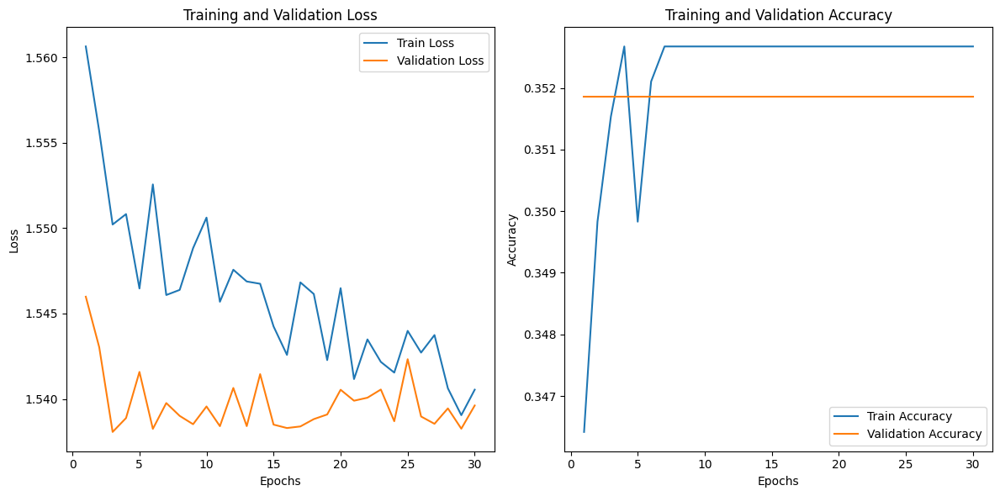

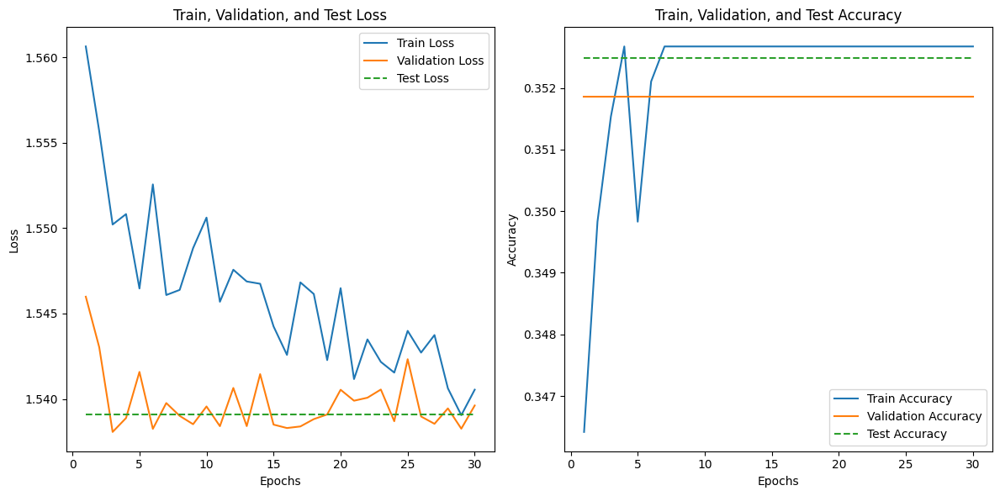

In [37]:
evaluate_model(model, history, test_generator, class_labels)

We can infer the following:

* The test loss is **1.5391**, indicating the average loss per sample on the test dataset.
* The test accuracy is **0.3525**, which means the model correctly classified approximately 35.25% of the test samples.
* The F1 score is **0.1837**, which is a measure of the model's accuracy in terms of both precision and recall. It indicates the balance between precision and recall, with higher values indicating better performance.
* The precision is **0.1242**, which represents the ratio of correctly predicted positive observations to the total predicted positives. It indicates how many of the predicted positive instances are actually positive.
* The recall is **0.3525**, representing the ratio of correctly predicted positive observations to the all observations in actual class. It indicates the ability of the model to find all the positive samples.
* The EfficientNet model achieved relatively low accuracy and F1 score on the test dataset. The precision and recall values are also quite low, indicating that the model struggles to accurately classify the samples, particularly in terms of both false positives and false negatives.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.6 |</span><span style='color:black; font-size: 16px;'> EfficientNETB5 Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.6.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [3]:
from tensorflow.keras.applications import EfficientNetB5
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

# Define input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

# Load pre-trained EfficientNetB5 model
efficientnetb5_model = EfficientNetB5(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in efficientnetb5_model.layers:
    layer.trainable = False

# Create a Sequential model
efficientnetb5_custom_model = Sequential(name='EfficientNetB5')

# Add the pre-trained EfficientNetB5 model to the Sequential model
efficientnetb5_custom_model.add(efficientnetb5_model)

# Add global average pooling layer to reduce parameters
efficientnetb5_custom_model.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
efficientnetb5_custom_model.add(Dense(64, activation='relu'))

# Add dropout layer
efficientnetb5_custom_model.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
num_classes = 5  # 5 classes (e.g., good, fair, poor, flooded, unpaved)
efficientnetb5_custom_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
efficientnetb5_custom_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print concise model summary
print("Model: EfficientNetB5")
efficientnetb5_custom_model.summary()

Model: EfficientNetB5


Model: "EfficientNetB5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb5 (Functional)     │ ?                      │    28,513,527 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,513,527 (108.77 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 28,513,527 (108.77 MB)

**Overview:**

- Layer Details: This model uses the EfficientNetB5 architecture, an advanced version in the EfficientNet series, known for its robust performance in complex image recognition tasks. It extends the principles of balanced scaling to achieve higher accuracy with efficient parameter utilization.
- Architecture Unfolds As Follows:
 * EfficientNetB5 Base (Functional): The EfficientNetB5 model builds on the original EfficientNet design by scaling up the network dimensions, including depth, width, and resolution, in a balanced manner. This design enables superior handling of more complex datasets.
 * Global Average Pooling Layer: Positioned after the EfficientNetB5 base, this layer condenses feature maps across spatial dimensions to a single vector per map, significantly reducing data dimensionality while retaining critical spatial information.
 * Dense and Dropout Layers: Includes an initially unspecified dense layer followed by a dropout layer, intended to reduce overfitting by randomly omitting neurons during training. Another dense layer for final classification outputs is planned but remains unbuilt in the summary.
 * Total Parameters: 28,513,527, reflecting the model's expanded capacity to learn detailed features without excessive computational overhead.
 * Model Size: 108.77 MB, indicative of its comprehensive capability and depth, suited for environments where computational resources are sufficient to manage larger models.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.6.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [8]:
start = datetime.datetime.now()

In [9]:
history = efficientnetb5_custom_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1
)

# Evaluate on validation set
validation_loss, validation_accuracy = efficientnetb5_custom_model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

# Evaluate on test set
test_loss, test_accuracy = efficientnetb5_custom_model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
 1/55 ━━━━━━━━━━━━━━━━━━━━ 1:38:24 109s/step - accuracy: 0.1875 - loss: 1.6783

I0000 00:00:1713376377.289259      85 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


55/55 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step - accuracy: 0.3094 - loss: 1.6371 - val_accuracy: 0.3519 - val_loss: 1.5529
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.3297 - loss: 1.5724 - val_accuracy: 0.3519 - val_loss: 1.5431
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.3477 - loss: 1.5671 - val_accuracy: 0.3519 - val_loss: 1.5446
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.3539 - loss: 1.5732 - val_accuracy: 0.3519 - val_loss: 1.5459
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.3581 - loss: 1.5456 - val_accuracy: 0.3519 - val_loss: 1.5476
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.3645 - loss: 1.5436 - val_accuracy: 0.3519 - val_loss: 1.5444
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.3380 - loss: 1.5639 - val_accuracy: 0.3519 - val_loss: 1.5440
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.3424 - loss: 1.5595 - val_accuracy: 0.3519 - val_loss: 1.5447
Ep

In [22]:
end = datetime.datetime.now()
elapsed = end - start
print('EfficientNetB5 Model Training time:', elapsed)

EfficientNetB5 Model Training time: 0:38:27.519344


12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 632ms/step - accuracy: 0.3088 - loss: 1.6604
Test Loss: 1.5378223657608032
Test Accuracy: 0.352480411529541
12/12 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step 
Test F1 Score: 0.18372531427361716
Test Precision: 0.12424244490043561
Test Recall: 0.3524804177545692


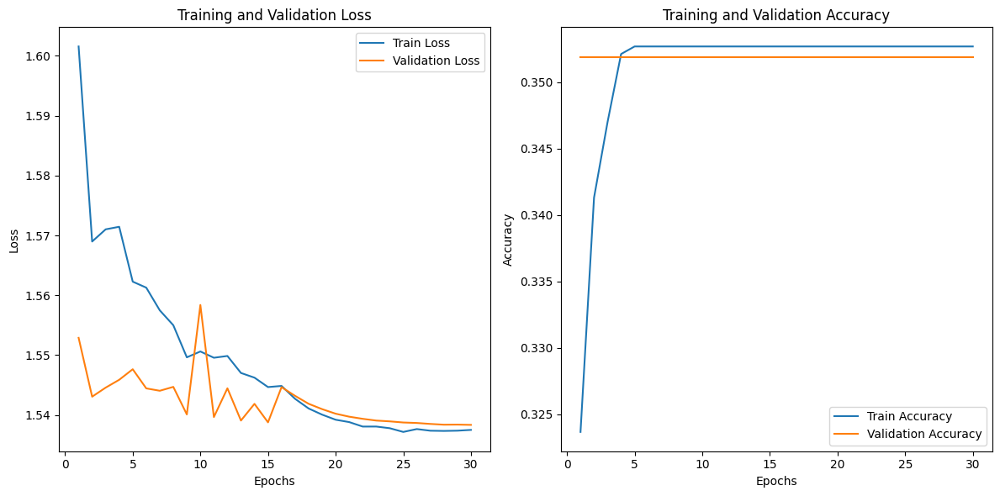

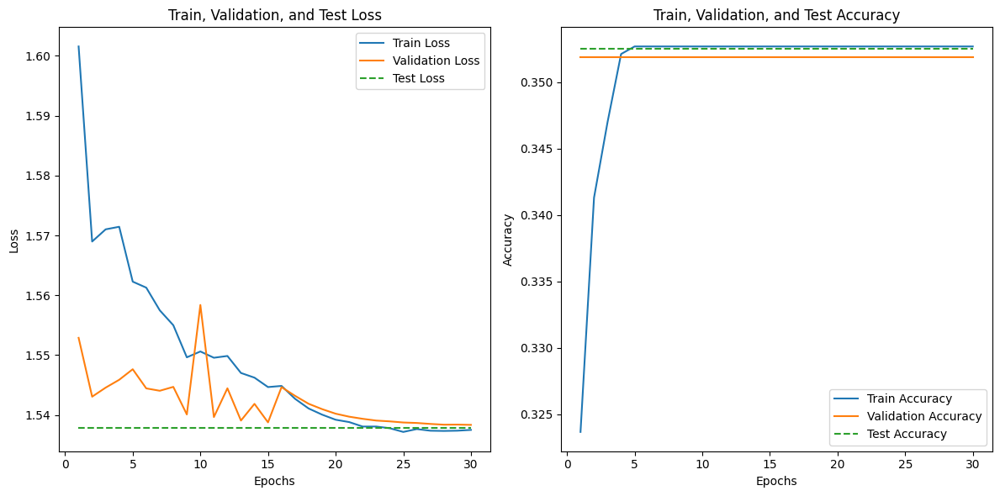

In [24]:
evaluate_model(efficientnetb5_custom_model, history, test_generator, class_labels)

We can infer the following: 

- The relatively low accuracy, F1 score, precision, and recall indicate that the model struggles to accurately classify road conditions from the provided images. 
- Despite being a more complex variant of EfficientNet, EfficientNetB5 seems to encounter challenges in effectively learning and generalizing from the data. 

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.7 |</span><span style='color:black; font-size: 16px;'> ResNET50 Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.7.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [32]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

# Define input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

# Load pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in resnet_model.layers:
    layer.trainable = False

# Create a Sequential model
model = Sequential(name='ResNet50')

# Add the pre-trained ResNet50 model to the Sequential model
model.add(resnet_model)

# Add global average pooling layer to reduce parameters
model.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
model.add(Dense(64, activation='relu'))

# Add dropout layer
model.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
num_classes = 5  # Assuming there are 5 classes (e.g., good, fair, poor, flooded, unpaved)
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print concise model summary
print("Model: ResNet50")
model.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Model: ResNet50


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

**Overview:**

- Layer Details: This model utilizes the ResNet50 architecture, a highly acclaimed deep neural network known for its use of residual connections which facilitate training deeper models by allowing gradients to flow through the network more effectively. ResNet50 is widely used for its ability to perform robustly across a broad range of image recognition tasks.
- Architecture Unfolds As Follows:
 * ResNet50 Base (Functional): The core of this model is the ResNet50 architecture, which incorporates residual connections (or skip connections) to combat the vanishing gradient problem in deep networks. This setup helps preserve information over many layers and promotes more accurate learning with deeper architectures.
 * Global Average Pooling Layer: Follows the dense block structures of the ResNet50 base, reducing the spatial dimensions of the feature maps to a single vector per map, which simplifies the output while maintaining important features.
 * Dense and Dropout Layers: Configured with an initially unspecified dense layer that is planned for classification purposes, complemented by a dropout layer to prevent overfitting by randomly dropping units during training phases. Another dense layer for outputting final classification results is also intended but remains unbuilt in the configuration summary.
 * Total Parameters: 23,587,712, highlighting the significant capacity of the model to learn detailed and complex patterns from large-scale data sets.
 * Model Size: 89.98 MB, reflecting a substantial model that leverages deep learning capabilities for high-performance tasks in environments where computational resources are not a limiting factor.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.7.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [33]:
start = datetime.datetime.now()

In [34]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1
)

# Evaluate on validation set
validation_loss, validation_accuracy = model.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

# Evaluate on test set
test_loss, test_accuracy = model.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - accuracy: 0.3068 - loss: 1.6657 - val_accuracy: 0.3519 - val_loss: 1.5337
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.3349 - loss: 1.5476 - val_accuracy: 0.3519 - val_loss: 1.5247
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step - accuracy: 0.3554 - loss: 1.5303 - val_accuracy: 0.3519 - val_loss: 1.5271
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step - accuracy: 0.3633 - loss: 1.5373 - val_accuracy: 0.3519 - val_loss: 1.5076
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.3590 - loss: 1.5328 - val_accuracy: 0.3519 - val_loss: 1.5090
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.3627 - loss: 1.5214 - val_accuracy: 0.3519 - val_loss: 1.5070
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.3439 - loss: 1.5284 - val_accuracy: 0.3519 - val_loss: 1.4982
Epoch 8/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.3473 - loss: 1.5269 - val_accuracy: 0.3519 - val_loss:

In [37]:
end = datetime.datetime.now()
elapsed = end - start
print('ResNET50 Training time:', elapsed)

ResNET50 Training time: 0:35:52.408457


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 614ms/step - accuracy: 0.3140 - loss: 1.4082
Test Loss: 1.3915084600448608
Test Accuracy: 0.355091392993927
12/12 ━━━━━━━━━━━━━━━━━━━━ 15s 887ms/step
Test F1 Score: 0.18920022367543254
Test Precision: 0.25511598977485545
Test Recall: 0.35509138381201044


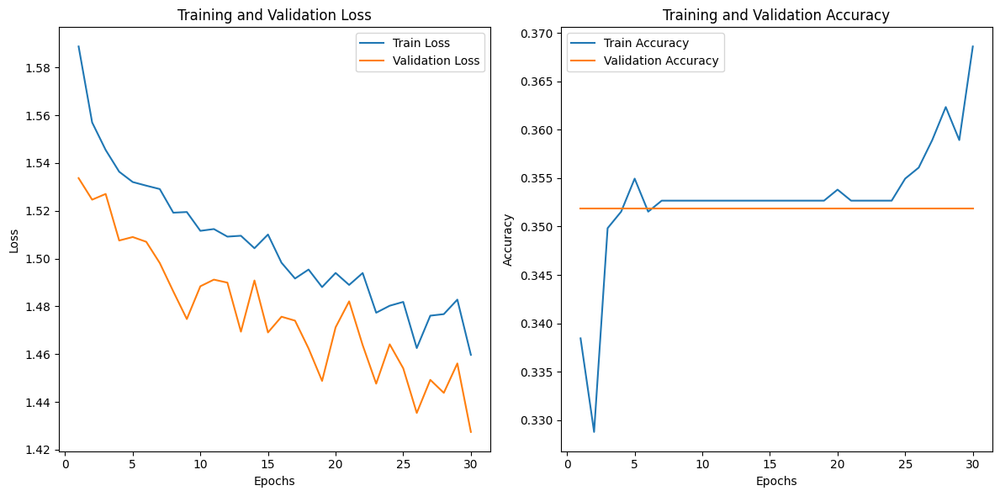

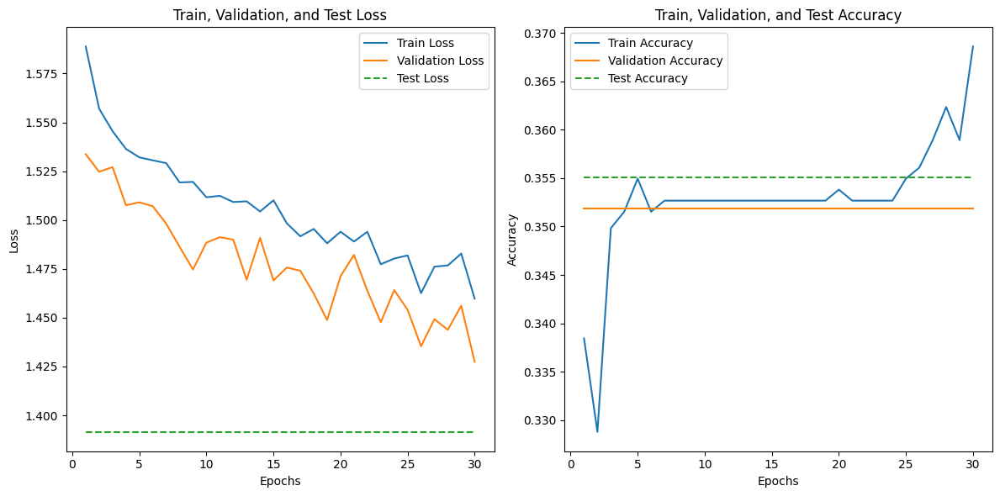

In [38]:
evaluate_model(model, history, test_generator, class_labels)

We can infer the following:
* Low Accuracy: The test accuracy of approximately **35.51%** suggests that the model struggles significantly with correctly identifying the correct road conditions. This level of accuracy is generally considered inadequate for most practical applications, where higher reliability is necessary.
* High Test Loss: The test loss of **1.3915** is relatively high, indicating that the model’s predictions are often far off from the actual labels. High loss values can imply issues with model architecture, insufficient training, or data that is not representative or sufficiently diverse.
* F1 Score **(18.92%)**: This score is quite low, reflecting poor overall model performance in terms of both precision and recall. The F1 score is a harmonic mean of precision and recall and is very sensitive to low values, indicating that the model is not balancing false positives and false negatives effectively.
* Inference Time and Efficiency: The inference times of 614 ms per step, accumulating to a total of **35:52 mins** for 30 epochs suggests that the model's efficiency could be improved. This inefficiency could become more pronounced when deployed in real-time or on less powerful hardware.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.8 |</span><span style='color:black; font-size: 16px;'> NASNeTLarge Model </span></b>

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.8.1 |</span><span style='color:black; font-size: 16px;'> Model Definition </span></b>

In [16]:
from tensorflow.keras.applications import NASNetLarge
from tensorflow.keras.models import Sequential

# Define input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

# Load pre-trained NASNetLarge model
nasnet_model = NASNetLarge(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze all layers of the pre-trained model
for layer in nasnet_model.layers:
    layer.trainable = False

# Create a Sequential model
custom_nasnet = Sequential(name='NASNet_Custom')

# Add the pre-trained NASNetLarge model to the Sequential model
custom_nasnet.add(nasnet_model)

# Add global average pooling layer to reduce parameters
custom_nasnet.add(GlobalAveragePooling2D())

# Add a fully connected layer with fewer neurons
custom_nasnet.add(Dense(128, activation='relu'))

# Add dropout layer
custom_nasnet.add(Dropout(0.5))

# Add output layer with softmax activation for multi-class classification
# Number of units should be equal to the number of classes
num_classes = 5  # 5 classes (e.g., good, fair, poor, flooded, unpaved)
custom_nasnet.add(Dense(num_classes, activation='softmax'))

# Compile the model
custom_nasnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
custom_nasnet.summary()

Model: "NASNet_Custom"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ NASNet (Functional)             │ ?                      │    84,916,818 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 84,916,818 (323.93 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 84,916,818 (323.93 MB)

**Overview:**

- Layer Details: This model is based on the NASNet architecture, a network structure derived from Neural Architecture Search (NAS) that optimizes both accuracy and computational efficiency. NASNet models are known for their ability to dynamically adjust to varying image recognition requirements, making them highly adaptable for complex tasks.
- Architecture Unfolds As Follows:
 * NASNet Base (Functional): At its core, the NASNet uses a set of optimized convolutional building blocks selected through machine learning algorithms to maximize performance. This approach results in an architecture that is both deep and wide yet efficiently manages computational resources.
 * Global Average Pooling Layer: Positioned after the NASNet base, this layer effectively reduces the spatial dimensions of the feature maps to a single vector per feature map, helping to minimize model complexity while retaining essential spatial hierarchies.
 * Dense and Dropout Layers: Includes a planned but unbuilt dense layer intended for the final classification task, coupled with a dropout layer to enhance the model's ability to generalize by preventing overfitting through the random omission of units during training. Another dense layer is designed to provide the final output predictions but remains unbuilt.
 * Total Parameters: 84,916,818, illustrating the extensive learning capacity and complexity of the NASNet architecture.
 * Model Size: 323.93 MB, indicating a very substantial model that leverages cutting-edge architecture for exceptional performance in large-scale applications where model accuracy and adaptability are critical.

<a id="basic"></a>
<b><span style='color:blue; font-size: 16px;'>Step 4.8.2 |</span><span style='color:black; font-size: 16px;'> Model Evaluation </span></b>

In [18]:
start = datetime.datetime.now()

In [19]:
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping

# Define a function to schedule the learning rate
def lr_scheduler(epoch):
    if epoch < 10:
        return 0.001
    elif epoch < 20:
        return 0.0001
    else:
        return 0.00001

# Define the LearningRateScheduler callback
learning_rate_scheduler = LearningRateScheduler(lr_scheduler)

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with the learning rate scheduler and early stopping callbacks
history = custom_nasnet.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[learning_rate_scheduler, early_stopping]
)

# Evaluate on validation set
validation_loss, validation_accuracy = custom_nasnet.evaluate(validation_generator, verbose=0)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

# Evaluate on test set
test_loss, test_accuracy = custom_nasnet.evaluate(test_generator, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/30
 1/55 ━━━━━━━━━━━━━━━━━━━━ 47:43 53s/step - accuracy: 0.1562 - loss: 1.6934

W0000 00:00:1713449089.837398     104 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4759 - loss: 1.3261

W0000 00:00:1713449166.643068     105 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


55/55 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.4779 - loss: 1.3217 - val_accuracy: 0.7778 - val_loss: 0.6309 - learning_rate: 0.0010
Epoch 2/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 57s 924ms/step - accuracy: 0.7453 - loss: 0.7895 - val_accuracy: 0.8122 - val_loss: 0.5620 - learning_rate: 0.0010
Epoch 3/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 57s 927ms/step - accuracy: 0.7643 - loss: 0.6663 - val_accuracy: 0.8307 - val_loss: 0.5028 - learning_rate: 0.0010
Epoch 4/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 57s 924ms/step - accuracy: 0.7687 - loss: 0.6543 - val_accuracy: 0.8624 - val_loss: 0.4442 - learning_rate: 0.0010
Epoch 5/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 57s 920ms/step - accuracy: 0.7901 - loss: 0.5917 - val_accuracy: 0.8466 - val_loss: 0.4740 - learning_rate: 0.0010
Epoch 6/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 934ms/step - accuracy: 0.7955 - loss: 0.5950 - val_accuracy: 0.8439 - val_loss: 0.4348 - learning_rate: 0.0010
Epoch 7/30
55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 906ms/step - accuracy: 0.8110 - loss: 0.5318 - val_ac

In [20]:
end = datetime.datetime.now()

elapsed = end - start

print('NASNetLarge Model Training time:', elapsed)

NASNetLarge Model Training time: 0:25:11.750351


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 536ms/step - accuracy: 0.8658 - loss: 0.3211
Test Loss: 0.2678587734699249
Test Accuracy: 0.8903394341468811
 2/12 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step

W0000 00:00:1713450613.959400     103 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


12/12 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step 
Test F1 Score: 0.8897301168593799
Test Precision: 0.890466779805521
Test Recall: 0.8903394255874674


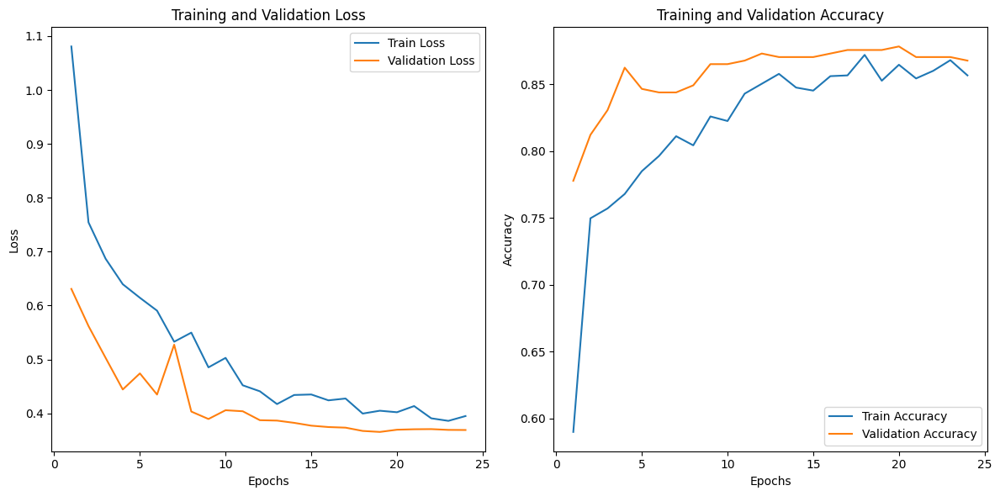

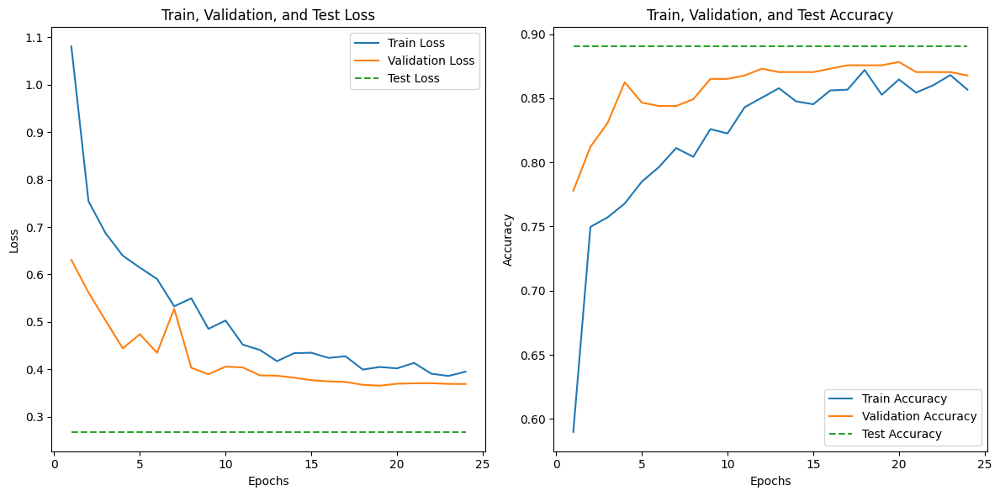

In [23]:
evaluate_model(custom_nasnet, history, test_generator, class_labels)

We can infer the following: 

- **High Accuracy:** The test accuracy of approximately **89.03%** indicates that the model performs well in distinguishing between different road conditions. This level of accuracy is robust for practical applications, such as autonomous driving systems or maintenance scheduling, where accurate road condition assessment is critical.
- **High F1 Score:** An F1 score of **88.97%** further confirms the model's balanced performance in terms of precision and recall. The F1 score is particularly important in scenarios where an uneven class distribution might exist (such as one road condition being more common than others), as it provides a single metric that balances both the precision and recall.
- **Low Test Loss:** The test loss of **0.2679** indicates that, on average, the model's predictions are close to the actual labels. Lower loss values generally correlate with better model predictions and reliability.
- **Inference Time and Performance:** The detailed inference times, with each step taking approximately 157 ms and the total process completing in about **25:11 mins** for 24 epochs, suggest that the model operates efficiently within reasonable computational limits. This efficiency is important for deployment in real-time systems.

In [54]:
# Save the trained model
# custom_nasnet.save("saved_nasnet.hdf5")

<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 5 | Model Comparison
</strong></p>

This table summarizes the performance of various deep learning models used in this road condition classification project.

| SN.NO | Model Name                    | Test Loss | Test Accuracy | Test F1 Score | Test Precision | Test Recall | Training Time | Notes                                               |
|-------|-------------------------------|-----------|---------------|---------------|----------------|-------------|---------------|-----------------------------------------------------|
| 1     | Baseline Model                | 1.0663    | 59.01%        | 55.55%        | 63.36%         | 59.01%      | 28.42 mins    | Baseline configuration                              |
| 2     |CNN with Different Architecture| 1.3793    | 47.26%        | 36.71%        | 30.90%         | 47.26%      | 27.47 mins    | Added more layers to baseline CNN, may overfit      |
| 3     | VGG16 Model                   | 0.5673    | 77.28%        | 77.02%        | 77.87%         | 77.28%      | 33:29 mins    | Good generalization capabilities                    |
| 4     | Densenet Model                | 0.2688    | 91.12%        | 91.03%        | 91.24%         | 91.12%      | 30:54 mins    | Small size and accurate, excellent efficiency       |
| 5     | Tuned Densenet Model          | 0.3269    | 90.08%        | 90.02%        | 90.40%         | 90.08%      | 39:54 mins    | Fine-tuned with Early Stopping, optimized parameters|
| 6     | EfficientnetB0                | 1.5391    | 35.25%        | 18.37%        | 12.42%         | 35.25%      | 38:26 mins    | Struggled with complex road conditions              |
| 7     | EfficientnetB5                | 1.5378    | 35.25%        | 18.37%        | 12.42%         | 35.25%      | 38:27 mins    | Similar issues as B0, no improvement                |
| 8     | Resnet50                      | 1.3915    | 35.51%        | 18.92%        | 25.51%         | 35.51%      | 35:52 mins    | Underperformed in precision and recall              |
| 9     | NasnetLarge Model             | 0.2679    | 89.03%        | 88.97%        | 89.05%         | 89.03%      | 25:11 mins    | Shortest training time, highly efficient            |
## Observations
- **Densenet Model** and **Tuned Densenet Model** exhibit the highest accuracy, demonstrating their effectiveness in classifying road conditions.
- **VGG16 Model** also shows robust performance, significantly outperforming other architectures except for the Densenet models and **NasnetLarge Model**.
- The **Efficientnet models** and **Resnet50** seem to struggle, likely due to the complexity of the task or potential overfitting issues.
- **NasnetLarge Model** provides competitive performance, making it a potential candidate for further optimization and use.
- Training time varies, with the **NasnetLarge Model** showing not only high accuracy but also the shortest training duration among the top performers.

This comprehensive comparison will guide the selection of an optimal model for practical implementation in road condition assessment systems during the deployment phase.


<a id="import"></a>
<p style="background-color:lightblue; font-family:georgia; color:black; font-size:150%; text-align:center; border-radius:15px 50px;"><strong>Step 6 | Model Pickling
</strong></p>

In this section of the notebook, we focus on saving the best-performing model, the **DenseNET model**, using TensorFlow's model saving utility. This process encapsulates the entire model—architecture, weights, and training configuration—enabling it to be reloaded and deployed efficiently without needing to retrain. 

In [35]:
# Save the best model
# tf.saved_model.save(densenet_custom_model, 'dense')

Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7b325d809cf0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7b325d80bd90>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Origin

In [3]:
# Load the SavedModel
loaded_model = tf.saved_model.load('dense')

# Get the default serving signature
inference_function = loaded_model.signatures["serving_default"]

# Load and preprocess the image
image_path = '/kaggle/input/more-test/close up images of good roads in India_94.png'  
image_size = (224, 224)  

# Load the image
image = tf.keras.preprocessing.image.load_img(image_path, target_size=image_size)

# Convert the image to a NumPy array
image_array = tf.keras.preprocessing.image.img_to_array(image)

# Expand dimensions to match the input shape expected by the model
image_array = np.expand_dims(image_array, axis=0)

# Normalize pixel values
image_array /= 255.0

# Perform inference using the loaded model
result = inference_function(inputs=image_array)['output_0']  

# Convert the result tensor to a NumPy array
result_array = result.numpy()

# Find the index of the maximum probability
predicted_label_index = np.argmax(result_array)

# list of class labels
class_labels = ['fair', 'flooded', 'good', 'poor', 'unpaved']

# Get the predicted label
predicted_label = class_labels[predicted_label_index]

print("Predicted label:", predicted_label)

Predicted label: good


This code snippet illustrates the following: 
- **Model Loading**: The DenseNet model is retrieved from a directory named 'dense' where it was preserved using TensorFlow's SavedModel format. 
- **Serving Signature Retrieval**: Upon loading, the model's default serving signature is accessed. This signature outlines how the model expects input to be formatted and specifies the format of the output predictions.
- **Image Loading and Preprocessing**:
  - **Load Image**: An image file is loaded from a specified path and resized to the model's expected input dimensions (224x224 pixels).
  - **Convert to Array**: The resized image is then converted into a NumPy array.
  - **Expand Dimensions**: The array's dimensions are expanded to include a batch dimension, conforming to the model's required input shape.
  - **Normalize Pixel Values**: The pixel values of the image are normalized to a range between 0 and 1, a preprocessing step that improves neural network efficacy.
- **Model Inference**:
  - **Perform Inference**: The preprocessed image is fed into the model, which performs inference and outputs logits or probabilities for each class.
  - **Process Output**: The output is analyzed to identify the class with the highest probability.
  - **Determine Predicted Label**: The class corresponding to the highest probability is designated as the predicted label.
- **Output**: The predicted label is printed, indicating the model's assessment of the road condition based on the image data provided.

<div style="border-radius:10px; padding: 15px; background-color: #FFFDD0; font-size:120%; text-align:left">

<h3 align="left"><font color=red>Conclusion:</font></h3>

This project successfully demonstrates the potential of deep learning in transforming road condition assessments, moving away from traditional manual methods to a more streamlined, automated approach. By integrating state-of-the-art deep learning models, the project addresses the inherent challenges of the Road Inventory & Condition Survey (RICS), notably its time-consuming and subjective nature. Our comprehensive evaluation of various models, as detailed in the model comparison table, highlights DenseNet as the most effective architecture, providing high accuracy, precision, and recall rates, which are vital for reliable classification.

The implementation of this automated system can significantly impact socio-economic factors by improving road safety, reducing maintenance overheads, and ensuring optimal allocation of resources. Policymakers and stakeholders are provided with a tool that offers not only faster but also more accurate data, facilitating better informed and timely decisions that can enhance the infrastructure's longevity and safety.

Furthermore, the data preprocessing steps undertaken to compile a diverse and representative dataset have set a benchmark for how road condition data should be gathered and analyzed. The project's data augmentation techniques have proven essential in enhancing the model's ability to generalize across various unseen conditions, thereby ensuring the model's robustness and applicability in real-world scenarios.

Ultimately, the deployment of this deep learning-based classification system could revolutionize road condition surveys, making them more scalable, cost-effective, accurate and open up potential avenues for crowd-sourcing solutions. This project not only supports the mandate of the **Kenya Roads Board** but also serves as a model that can be adapted and implemented in other regions of Africa and beyond, thereby contributing globally to the advancement of transportation infrastructure management.